In [1]:
# Hello Lab 1!

In [2]:
import matplotlib.pylab as pl
import numpy as np
import ugradio

import matplotlib.mlab as mlab
import math

%matplotlib inline

In [19]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://i.redd.it/keq6ufkn1gzy.png")

sample_1.npy
[ 13312   5376  -4864 ..., -14848 -16128 -11008]
[ 13312   5376  -4864 ..., -14848 -16128 -11008]


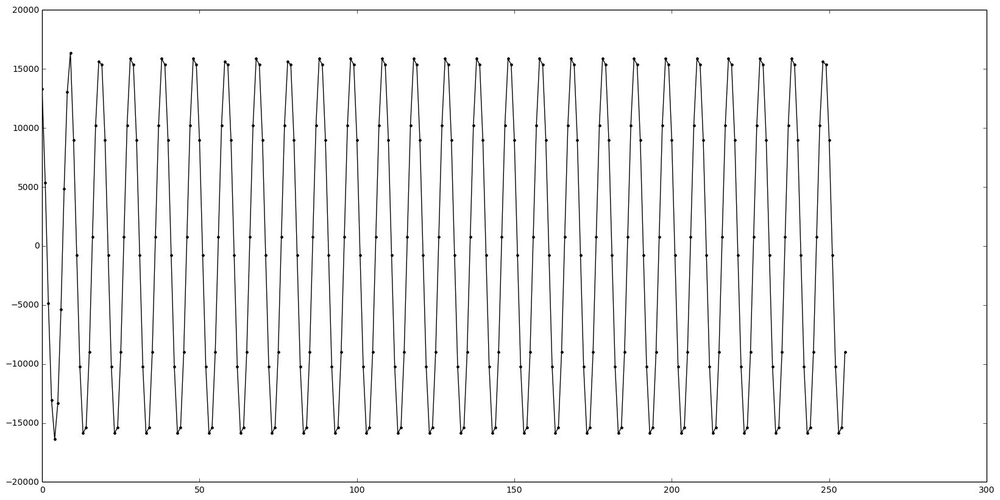

In [111]:
filename = "sample_" + str(i) + ".npy"
i+=1
print filename
arr = ugradio.pico.read_socket("2V", 10)
print arr
np.save(filename, arr)
print np.load(filename)
arr_plot = np.load(filename)
pl.figure(i, figsize=(20,10))
pl.plot(arr_plot[:256], 'k.-')

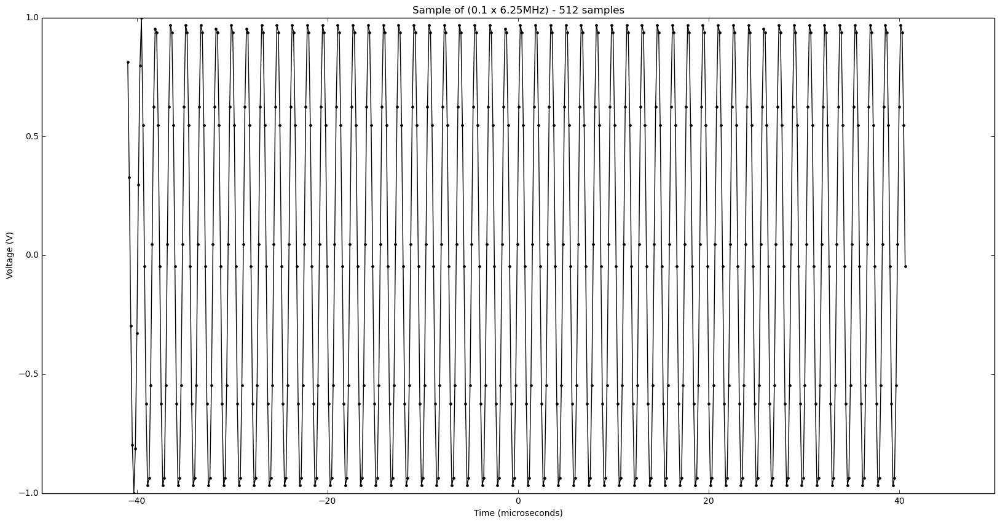

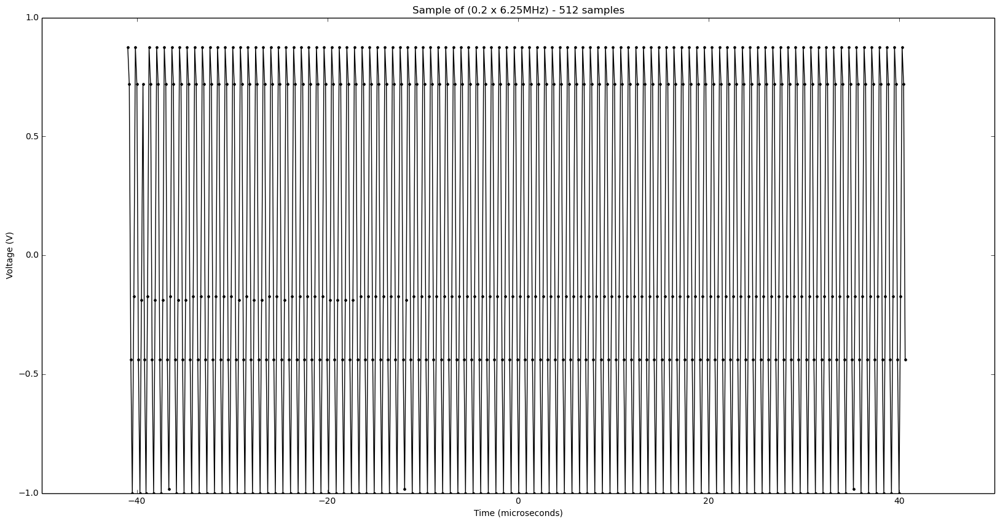

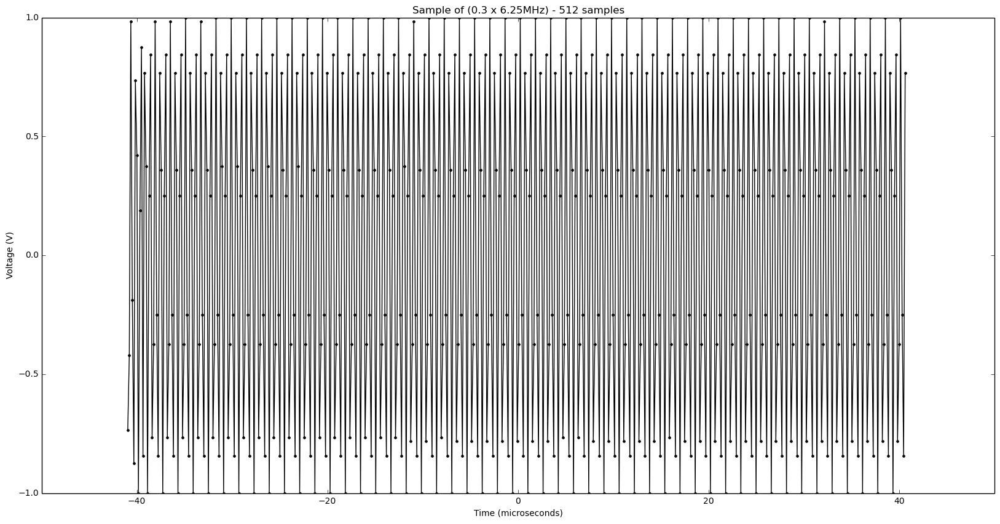

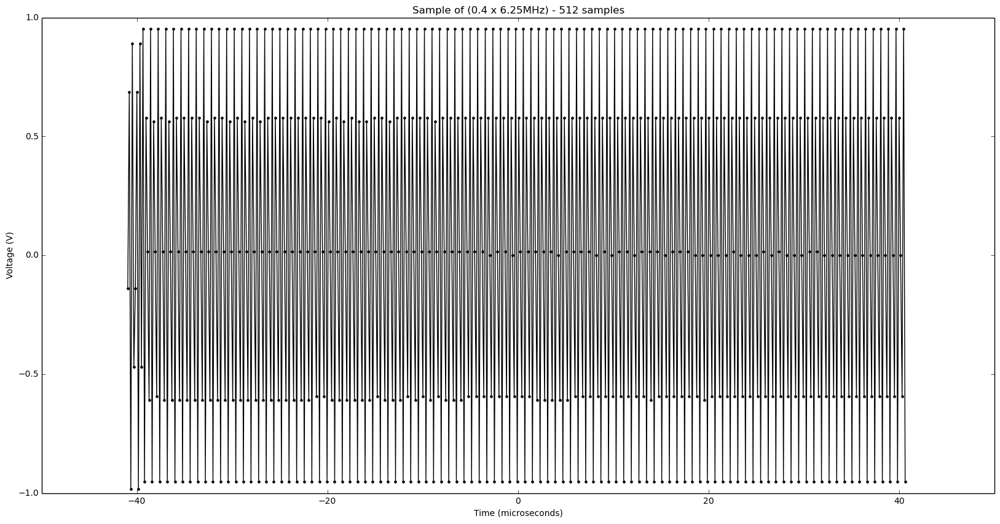

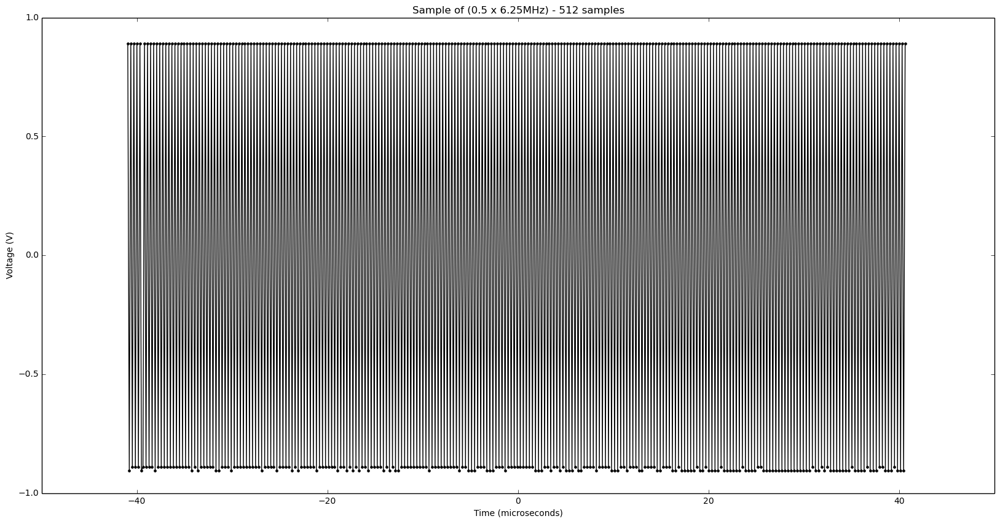

...

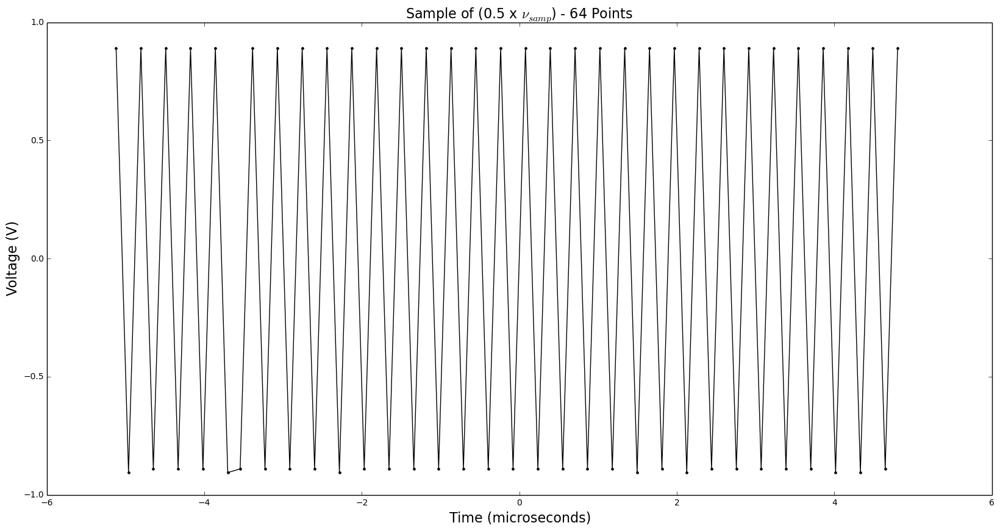

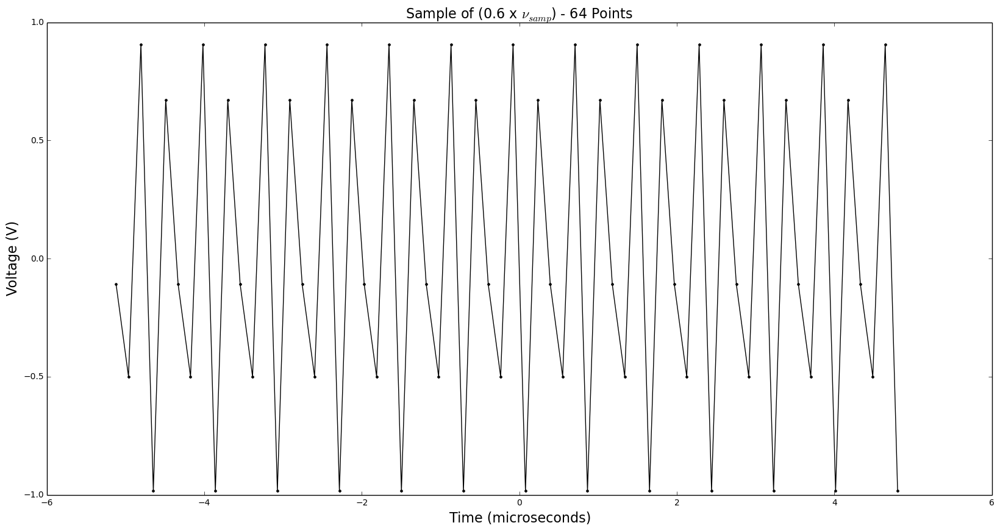

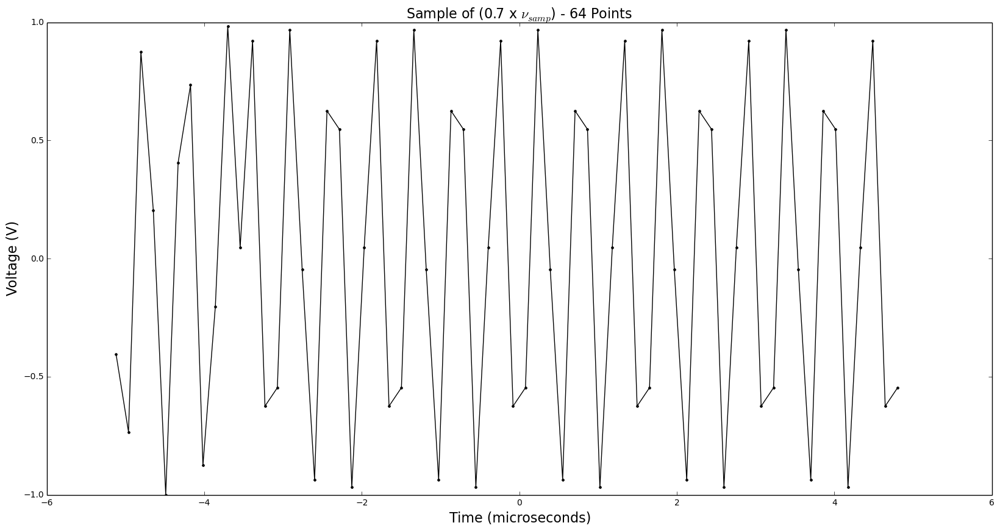

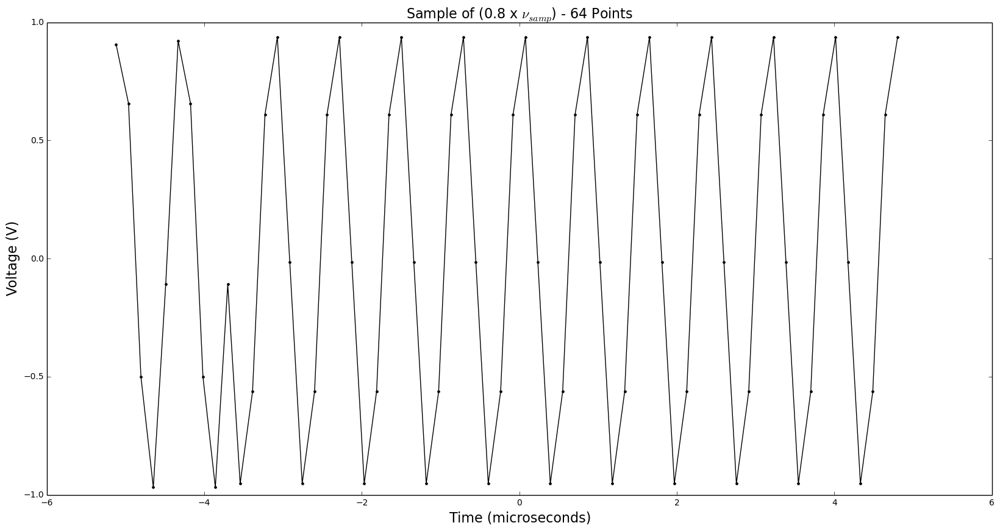

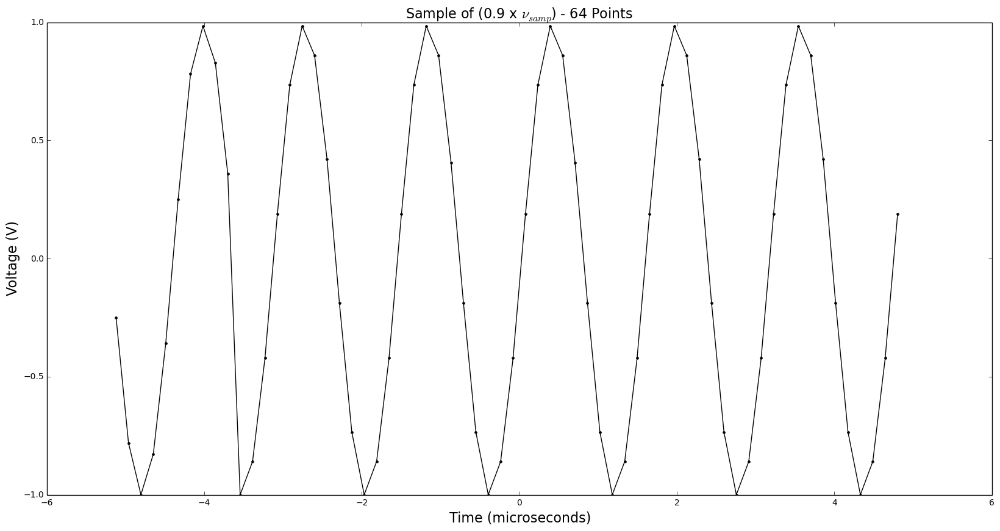

In [15]:
i = 1
N = 512
v_samp = 6.25 #MHz
for i in range(1, 10):
    filename = "sample_" + str(i) + ".npy"
    arr_plot = np.load(filename)
    arr_plot = np.divide(arr_plot, 16384.0)
    x_scale = np.linspace(-N/(2*v_samp), (N/2 - 1)/v_samp,num=N,endpoint=False)
    pl.figure(i, figsize=(20,10))
    pl.title("Sample of (0." + str(i) + " x " + str(v_samp) + "MHz) - " + str(N) + " samples")
    pl.ylabel('Voltage (V)')
    pl.xlabel('Time (microseconds)')
    pl.plot(x_scale, arr_plot[:N], 'k.-')
    
    x_scale_small = np.linspace(-(N/8)/(2*v_samp), ((N/8)/2 - 1)/v_samp, num = N/8, endpoint=False)
    pl.figure(i+9, figsize=(20,10))
    pl.title("Sample of (0." + str(i) + " x " + r"$\nu_{samp}$) - " + str(N/8) + " Points", fontsize=16)
    pl.ylabel('Voltage (V)', fontsize = 16)
    pl.xlabel('Time (microseconds)', fontsize=16)
    pl.plot(x_scale_small, arr_plot[:(N/8)], 'k.-')
    if i == 1:
        pl.savefig("graphs/test.pdf")

In [4]:
# getting plot as .pdf 
# FT = 0 is no Fourier Transform, FT = 1 is forward, FT = -1 is inverse
def plotAsPDF(filename, title, xaxis, yaxis, xscale, N=256, fsize=16, plotstyle='k.-', FT=0, power=False):
    
    savename = "graphs/" + filename[:-4] 
    arr_plot = np.load(filename)
    arr_plot = np.divide(arr_plot, 16384.0)
    pl.title(title, fontsize = fsize)
    pl.ylabel(yaxis, fontsize = fsize)
    pl.xlabel(xaxis, fontsize = fsize)
    
    if FT > 0:
        savename = savename + "_FT"
        freq_bins, fourier_transform = ugradio.dft.dft(arr_plot[N:2*N])
        if power:
            fourier_transform = np.abs(fourier_transform)**2
            savename = savename + "_power_spectrum"
        pl.plot(freq_bins, np.real(fourier_transform), plotstyle, linewidth = 2)
        if not power:
            pl.plot(freq_bins, np.imag(fourier_transform), 'r--', linewidth = 2)
        pl.savefig(savename + ".pdf")
    else:        
        pl.plot(xscale, arr_plot[N:2*N], plotstyle, linewidth = 2)
        pl.savefig(savename + ".pdf")

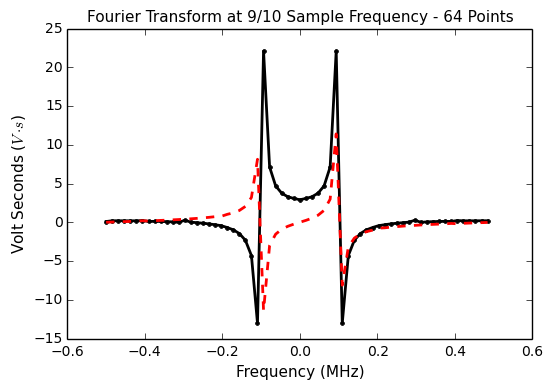

In [28]:
N = 64
filename = "sample_9.npy"
title = r"Fourier Transform at 9/10 Sample Frequency - " + str(N) + " Points"
yaxis = "Volt Seconds ($V \cdot s$)"
xaxis = r"Frequency (MHz)"
xscale = np.linspace(0, N/6.25,num=N,endpoint=False)
plotAsPDF(filename, title, xaxis, yaxis, xscale, N, fsize=11, FT=1 )

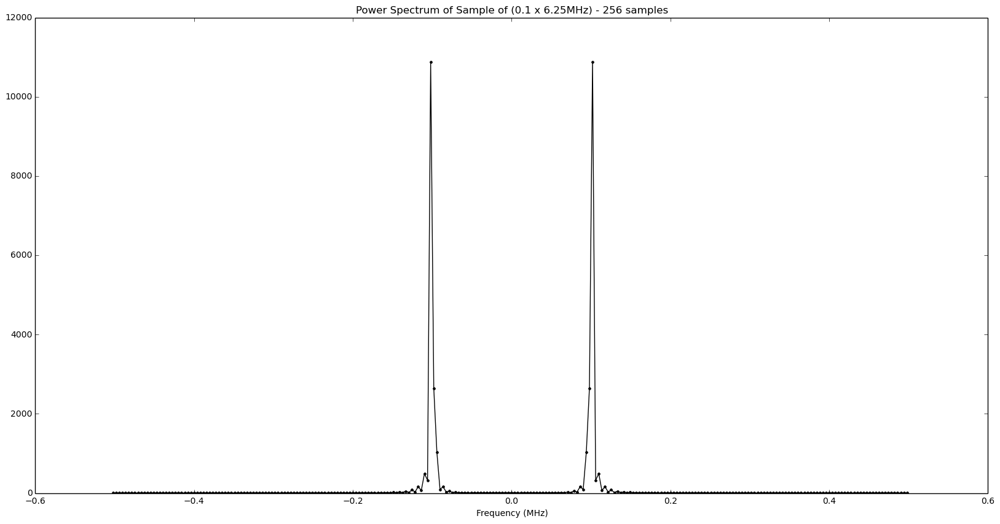

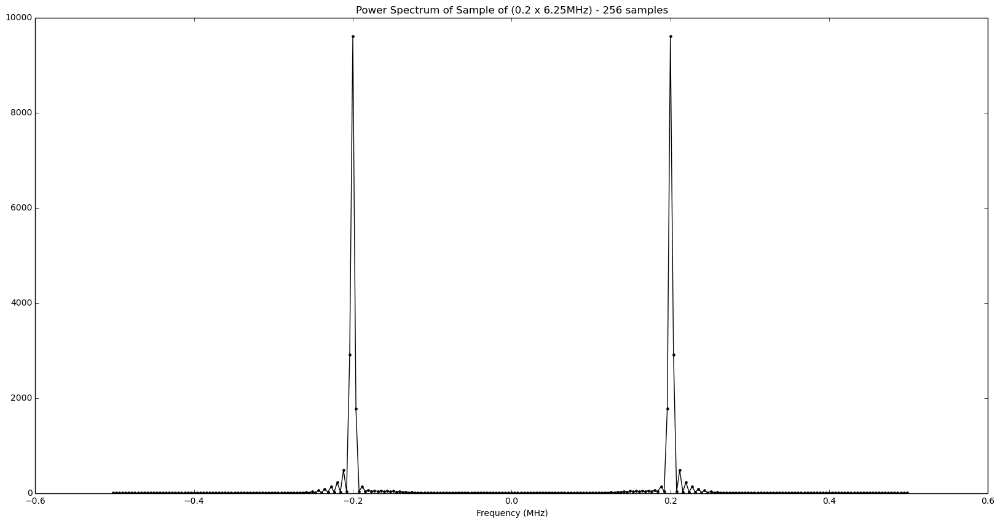

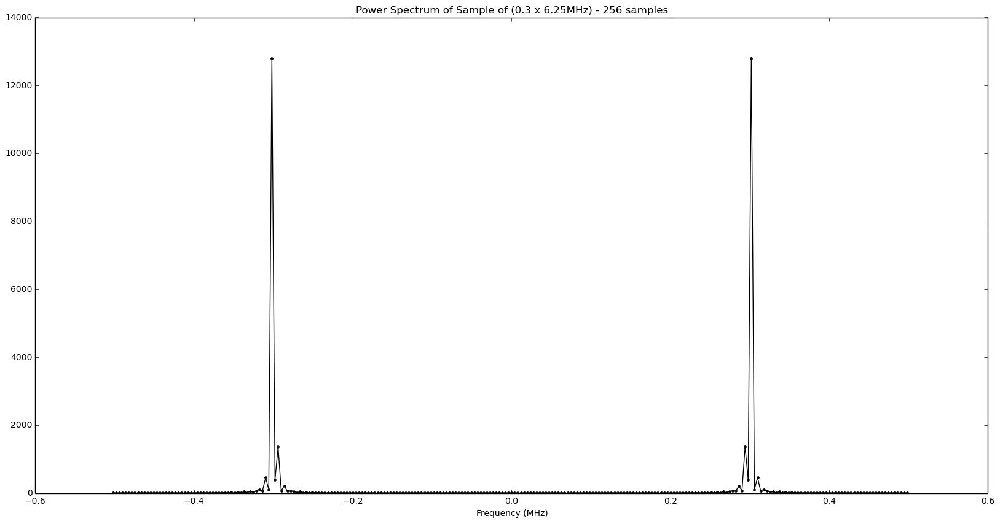

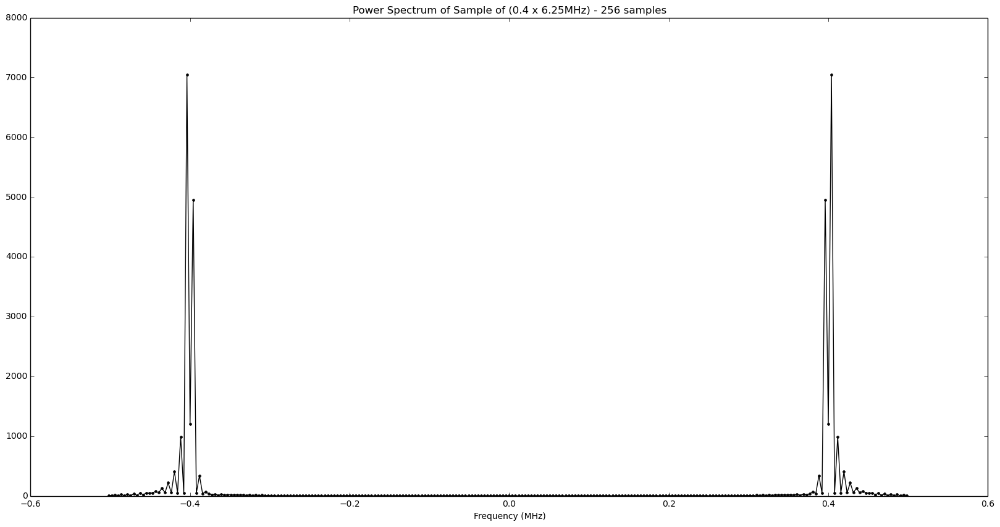

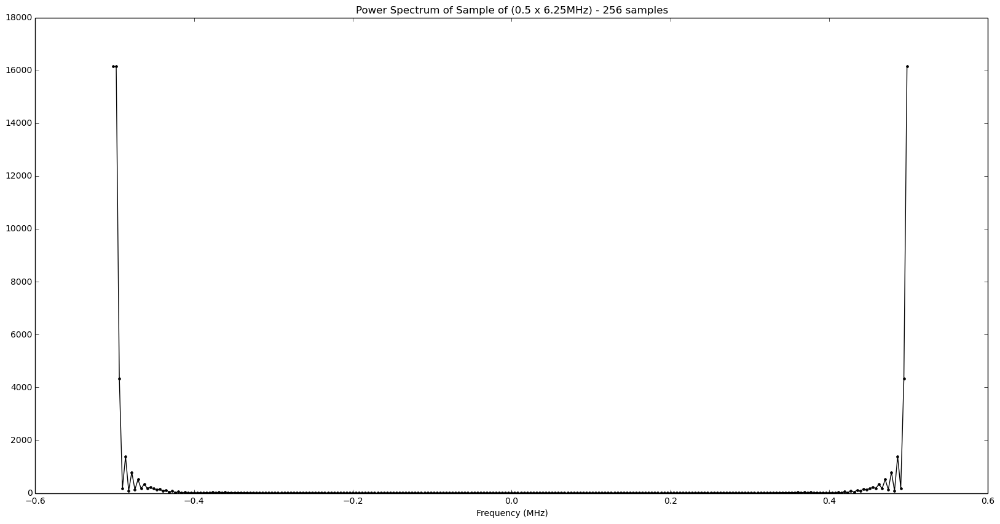

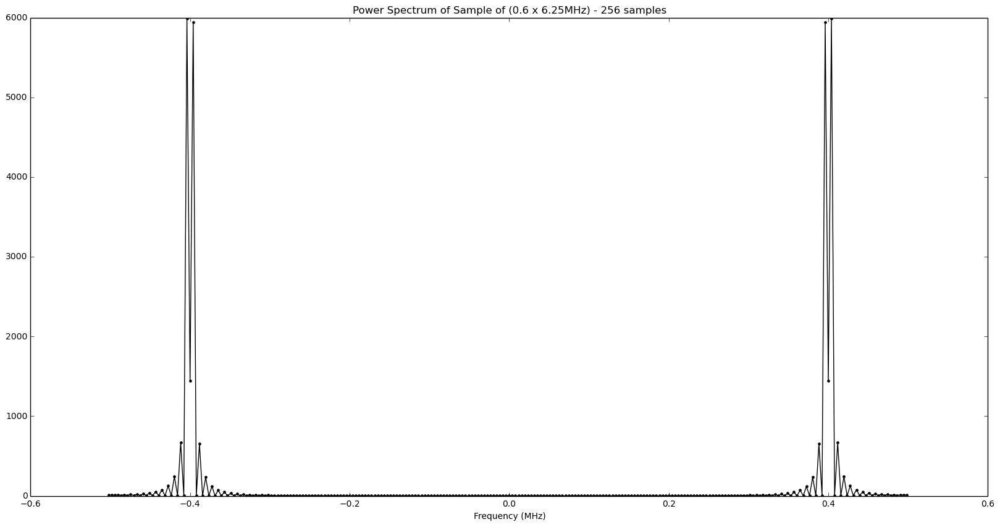

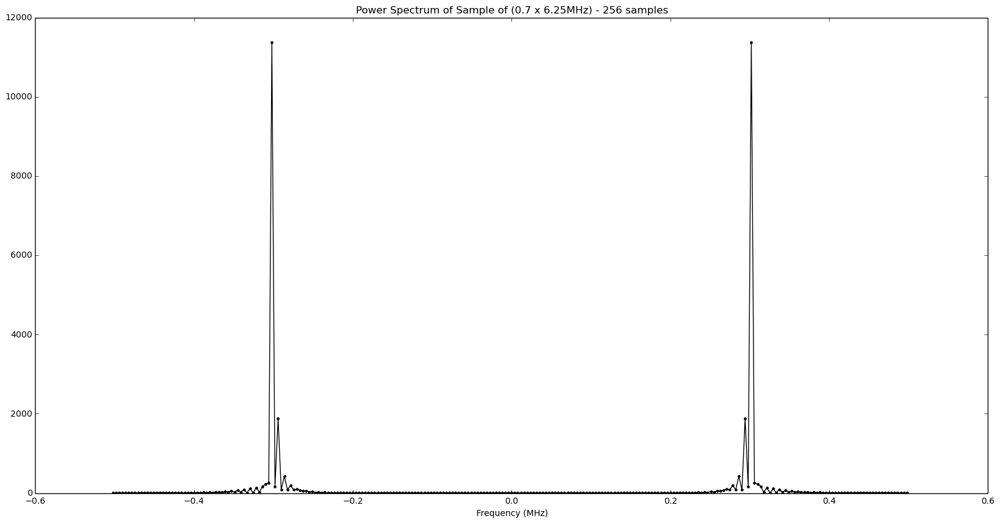

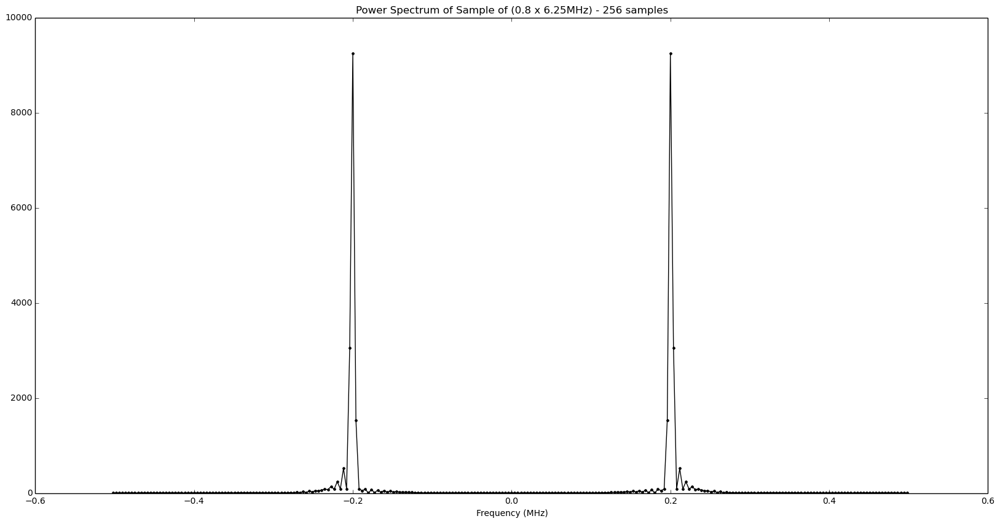

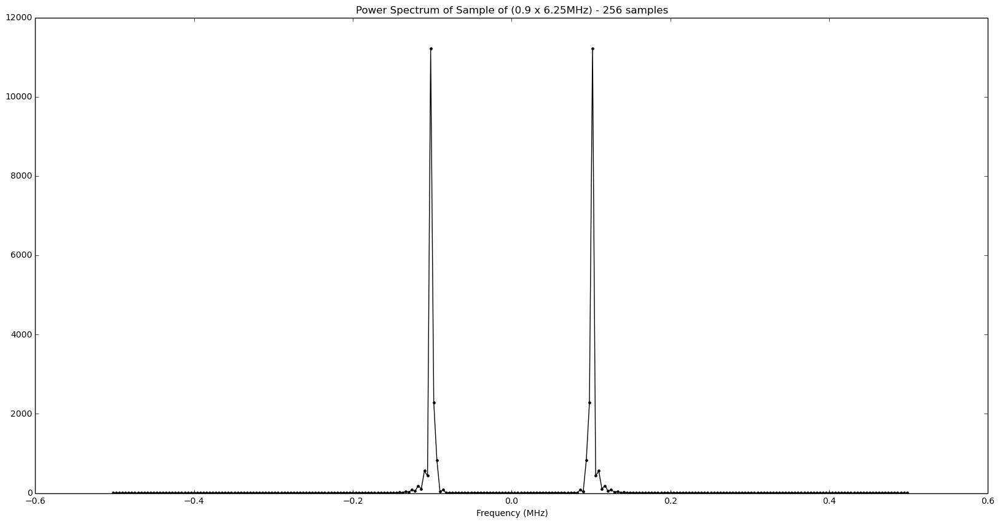

In [9]:
N = 256
v_samp = 6.25
freq = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N,endpoint=False)
for i in range(1, 10):
    filename = "sample_" + str(i) + ".npy"
    arr_plot = np.load(filename)
    arr_plot = np.divide(arr_plot, 16384.0)
    pl.figure(i, figsize=(20,10))
    freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
    fourier_test = np.abs(fourier_test)**2
    pl.title("Power Spectrum of Sample of (0." + str(i) + " x " + str(v_samp) + "MHz) - " + str(N) + " samples")
    pl.xlabel("Frequency (MHz)")
    pl.plot(freq_new, fourier_test, 'k.-')

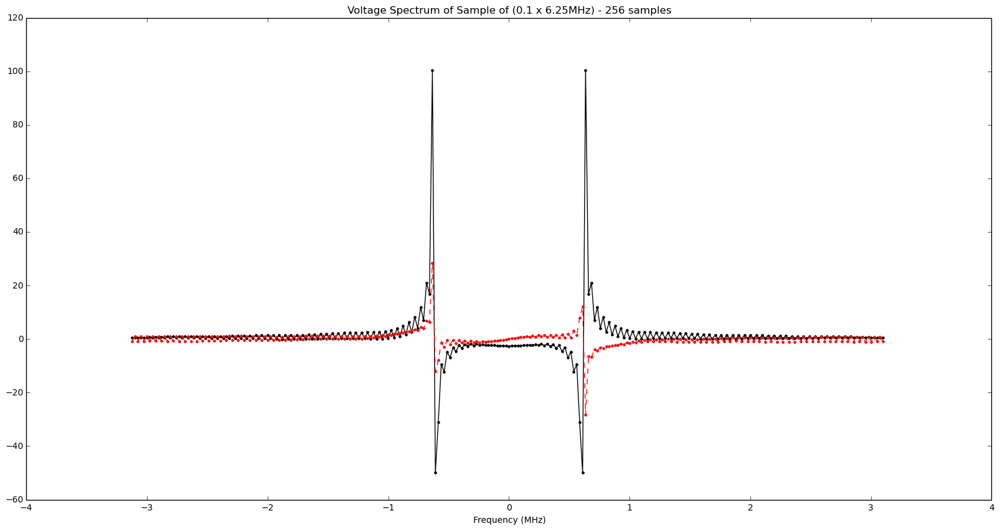

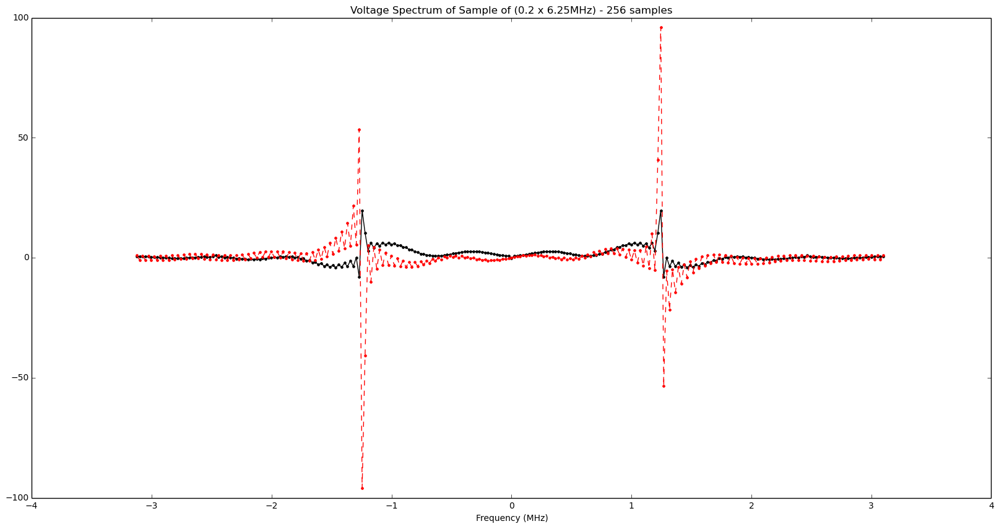

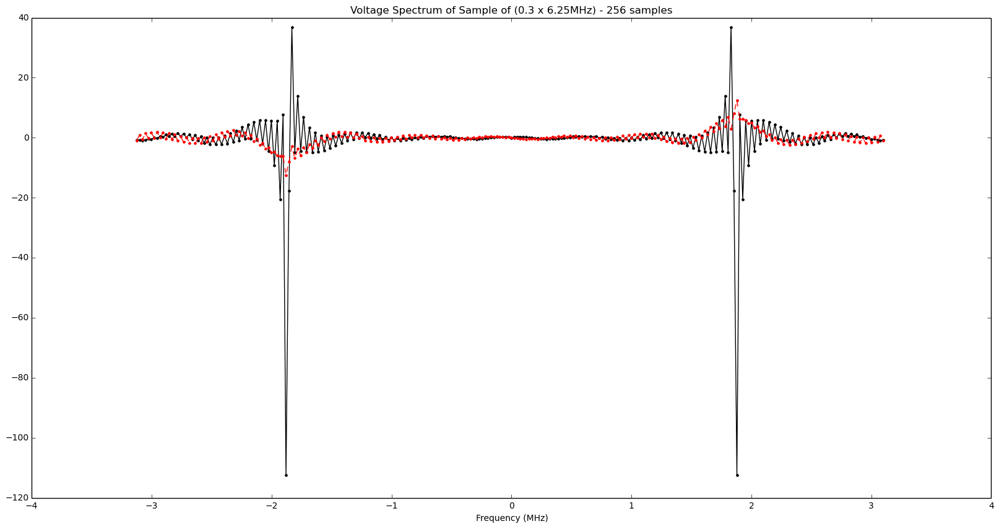

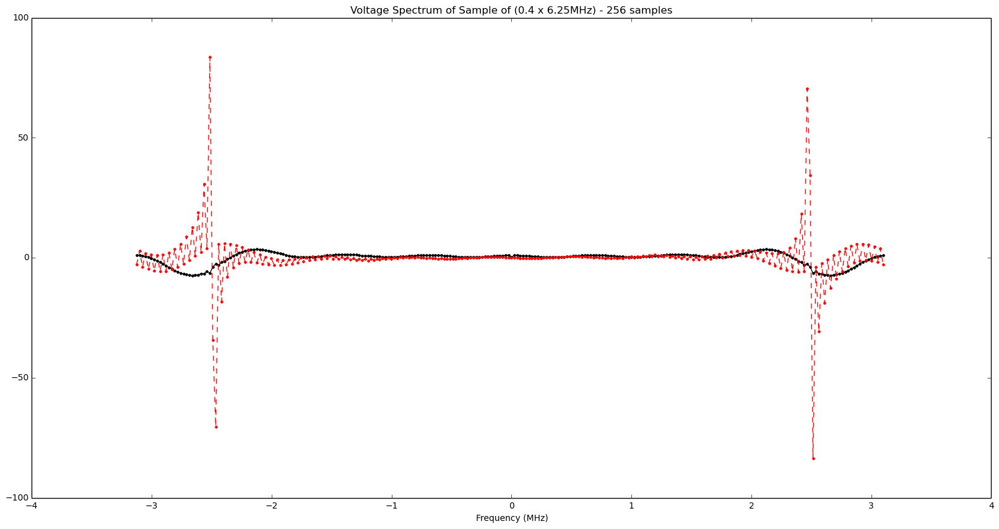

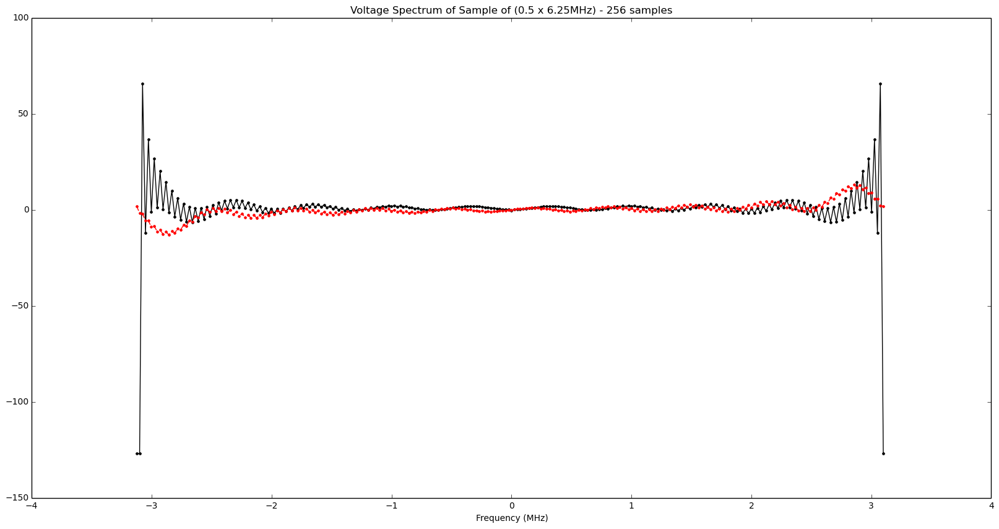

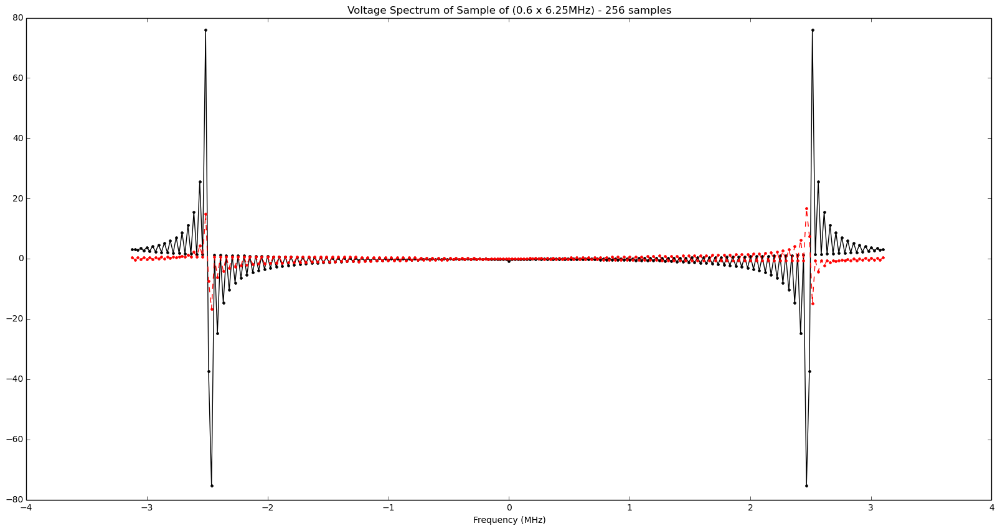

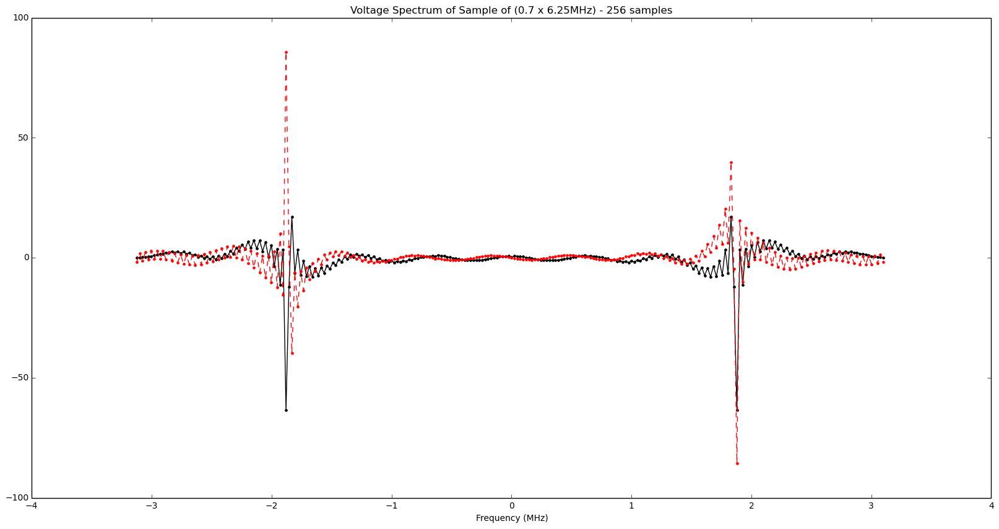

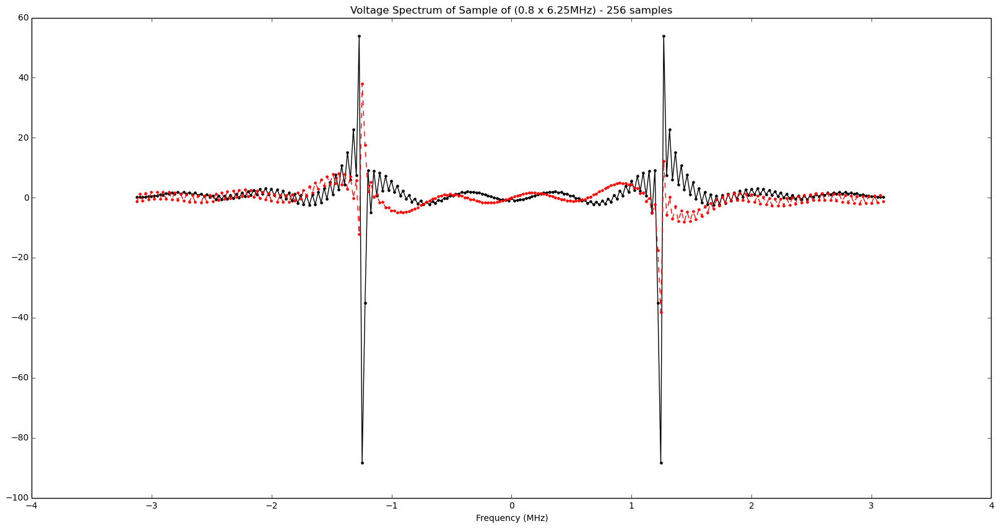

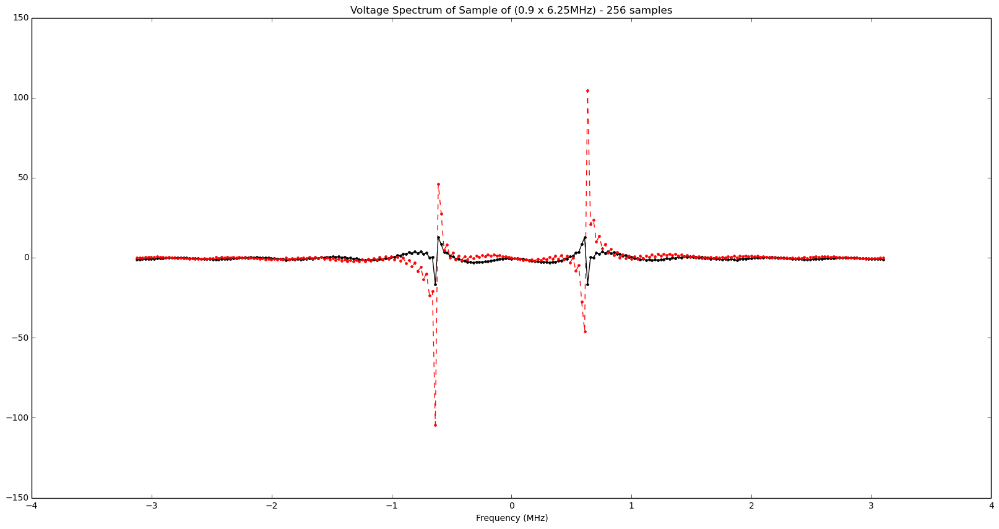

In [29]:
N = 256
chan = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N,endpoint=False)
for i in range(1, 10):
    filename = "sample_" + str(i) + ".npy"
    arr_plot = np.load(filename)
    arr_plot = np.divide(arr_plot, 16384.0)
    pl.figure(i, figsize=(20,10))
    voltage_test = ugradio.dft.dft(arr_plot[:N])[1]
    real = np.real(voltage_test)
    imag = np.imag(voltage_test)
    pl.title("Voltage Spectrum of Sample of (0." + str(i) + " x " + str(v_samp) + "MHz) - " + str(N) + " samples")
    pl.xlabel("Frequency (MHz)")
    pl.plot(chan, real, 'k.-')
    pl.plot(chan, imag, 'r.--')

32
32


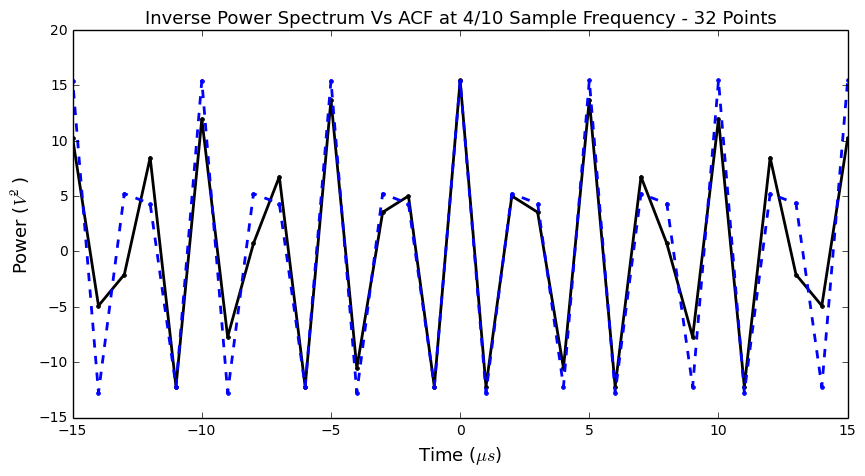

In [134]:
N = 32
v_samp = 6.25
filename = "sample_4.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)

pl.figure(figsize=(10, 5))

pl.title("Inverse Power Spectrum Vs ACF at 4/10 Sample Frequency - 32 Points", fontsize = 13)
pl.ylabel(r"Power ($V^2$)", fontsize = 13)
pl.xlabel(r"Time ($\mu s$)", fontsize = 13)

freq_bins, fourier_transform = ugradio.dft.dft(arr_plot[N:2*N])
power_spec = np.abs(fourier_transform)**2
new_bins, inv_fourier = ugradio.dft.idft(power_spec)

pl.xlim((-15, 15))
pl.plot(new_bins, inv_fourier, 'k.-', linewidth = 2)

ACF = np.correlate(arr_plot[N:2*N], np.concatenate((arr_plot[N:2*N], arr_plot[2*N:3*N-1])), "valid")
print len(ACF)
print len(new_bins)
pl.plot(new_bins, ACF, 'b.--', linewidth = 2)

pl.savefig("graphs/sample_4_ACF.pdf")

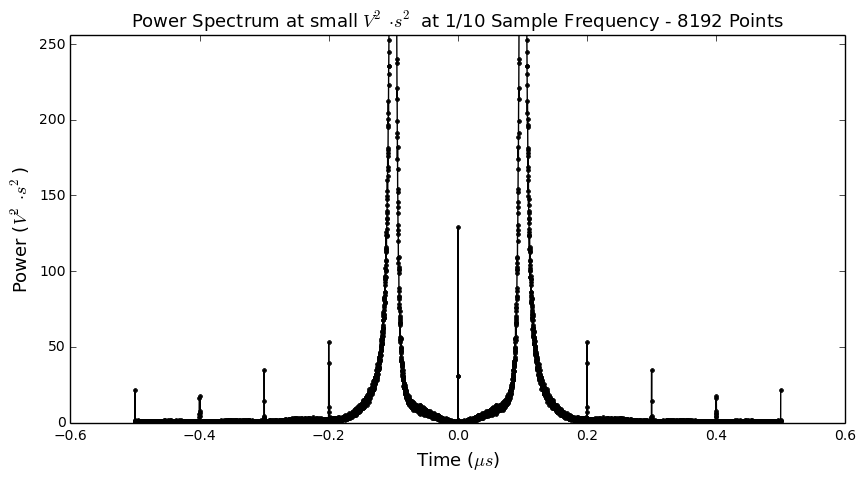

In [77]:
#3.4 - Leakage Power
N = 8192
v_samp = 6.25
freq = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N,endpoint=False)
filename = "sample_1.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(figsize=(10,5))
pl.gca().set_ylim(0, N/32)
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2

pl.title(r"Power Spectrum at small $V^2 \cdot s^2$ at 1/10 Sample Frequency - 8192 Points", fontsize = 13)
pl.ylabel(r"Power ($V^2 \cdot s^2$)", fontsize = 13)
pl.xlabel(r"Time ($\mu s$)", fontsize = 13)

pl.plot(freq_new, fourier_test, 'k.-')
pl.savefig("graphs/sample_1_Leakage.pdf")

NEW_Resolution_100_vs_150.npy
[13824 13312 12800 ..., 13824 14080 14080]
[13824 13312 12800 ..., 13824 14080 14080]


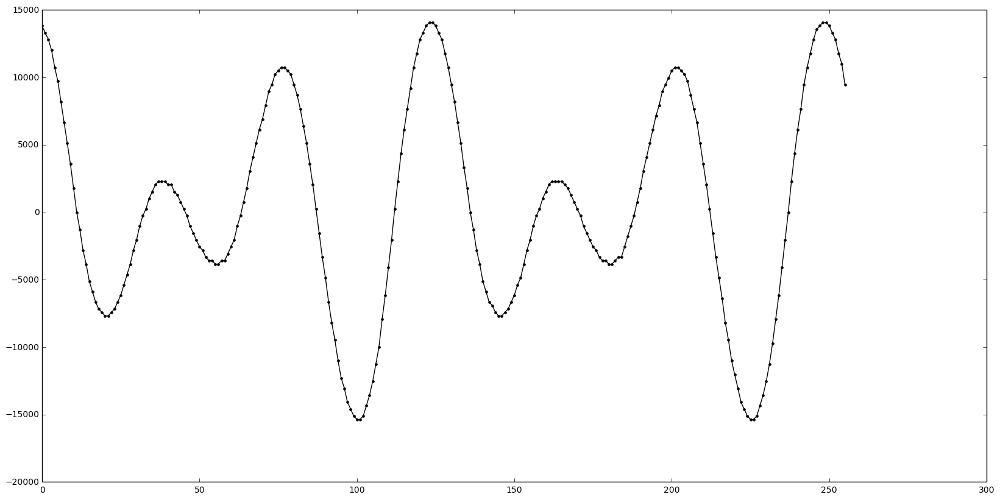

In [3]:
# 3.5 - Frequency Resolution 
filename = "NEW_Resolution_100_vs_150" + ".npy"
print filename
arr = ugradio.pico.read_socket("1V", 10)
print arr
np.save(filename, arr)
print np.load(filename)
arr_plot = np.load(filename)
pl.figure(figsize=(20,10))
pl.plot(arr_plot[:256], 'k.-')

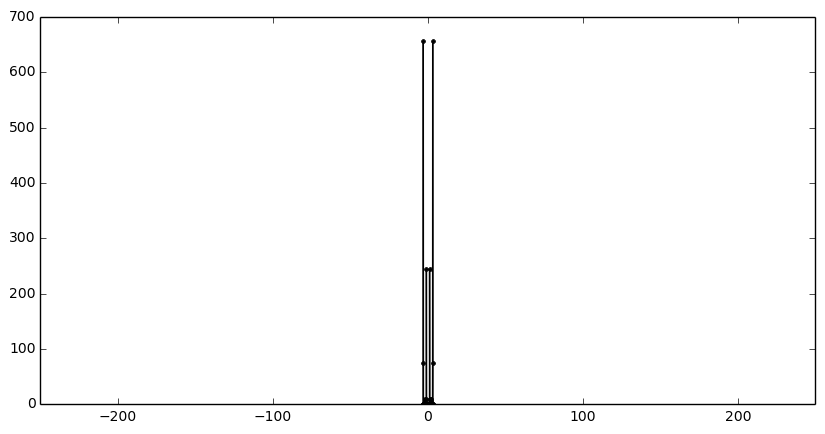

In [102]:
N = 128

input_freqs = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N,endpoint=False)

filename = "Resolution_100_vs_200" + ".npy"
res_arr = np.load(filename)
res_arr = np.divide(res_arr, 16384.0)
freqs, FT_res_arr = ugradio.dft.dft(res_arr[3*N:4*N],f=input_freqs)


power_res_arr = np.abs(FT_res_arr)**2
pl.figure(figsize=(10,5))
pl.gca().set_xlim(-250, 250)
pl.plot(freqs, power_res_arr, 'k.-')

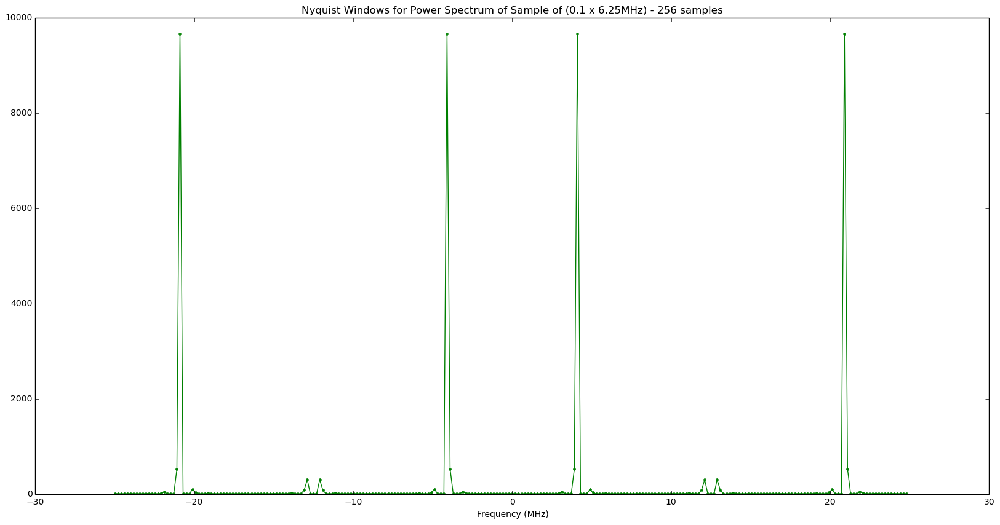

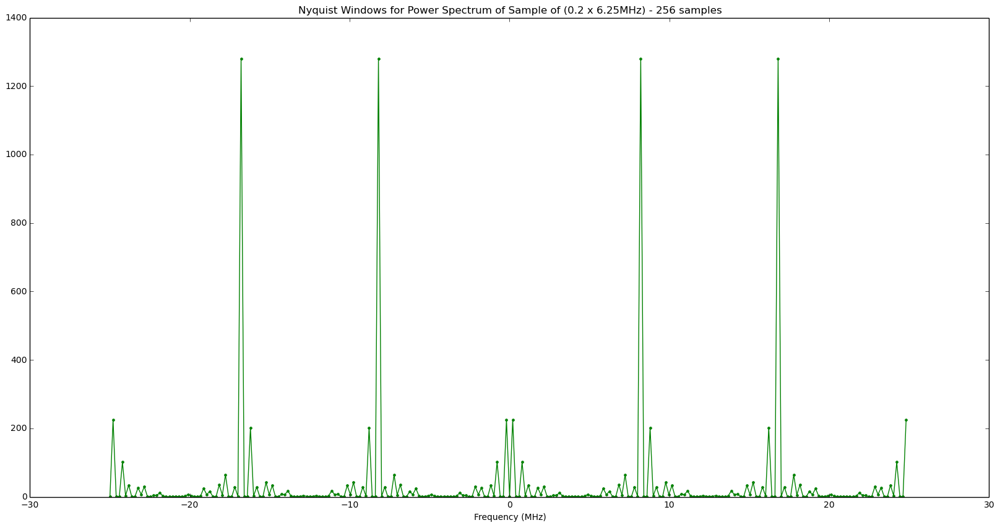

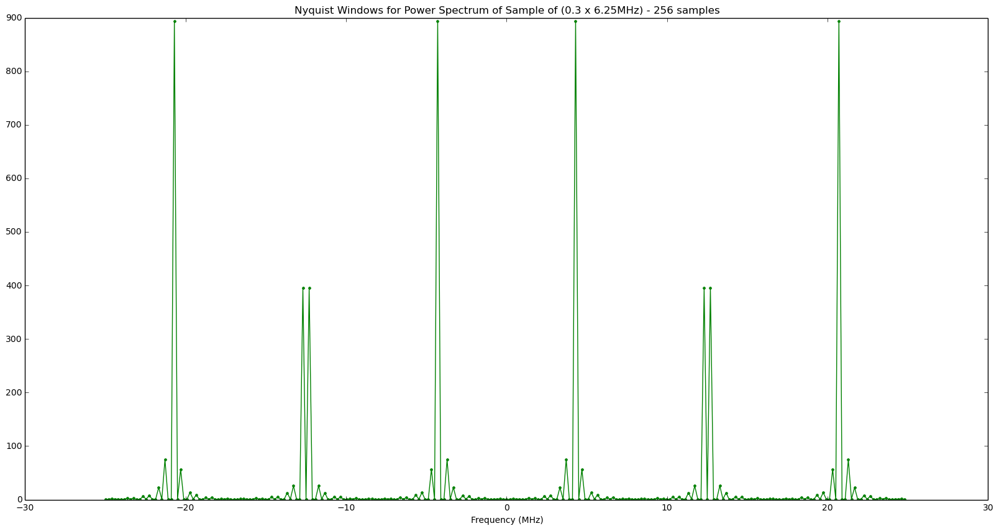

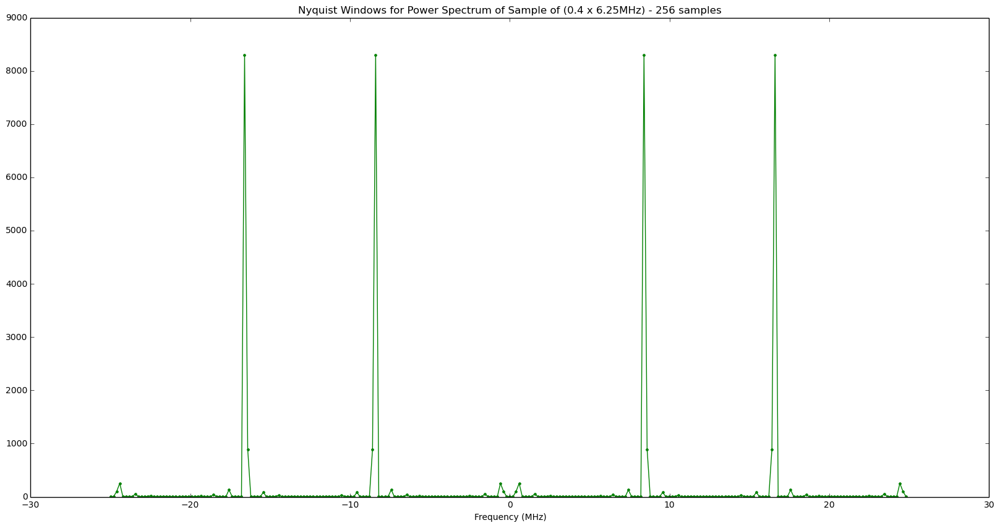

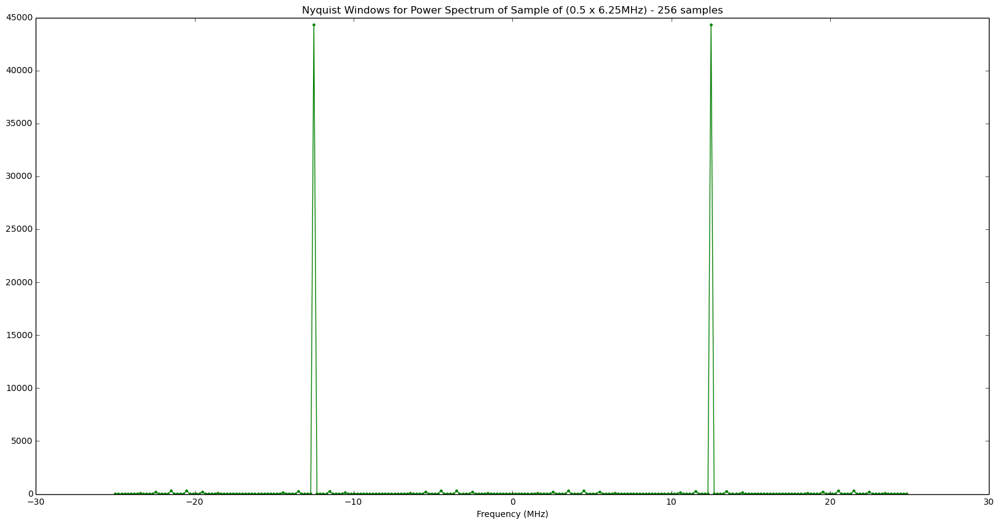

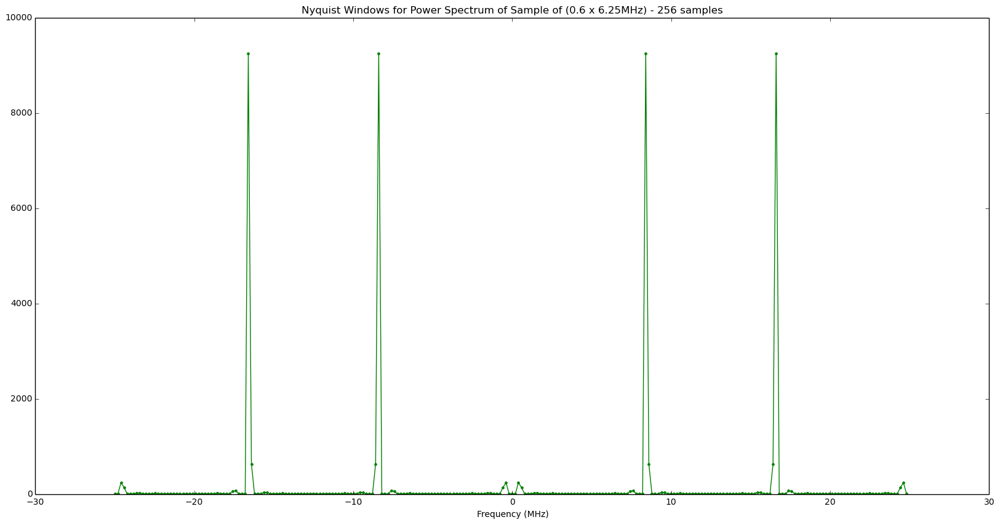

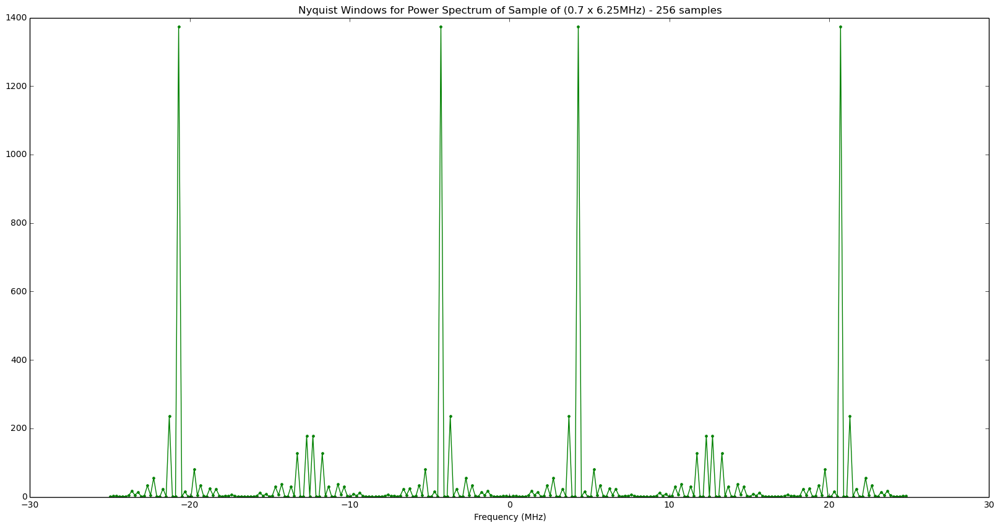

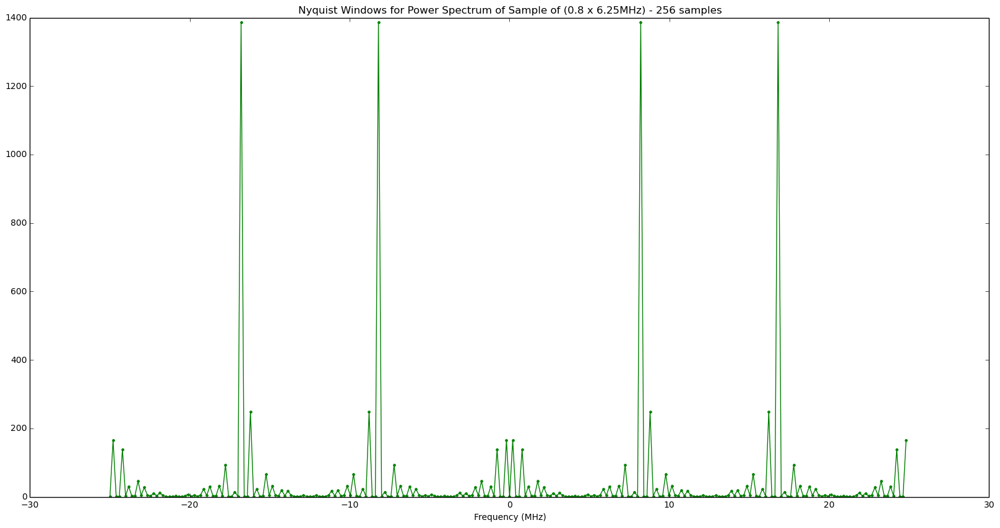

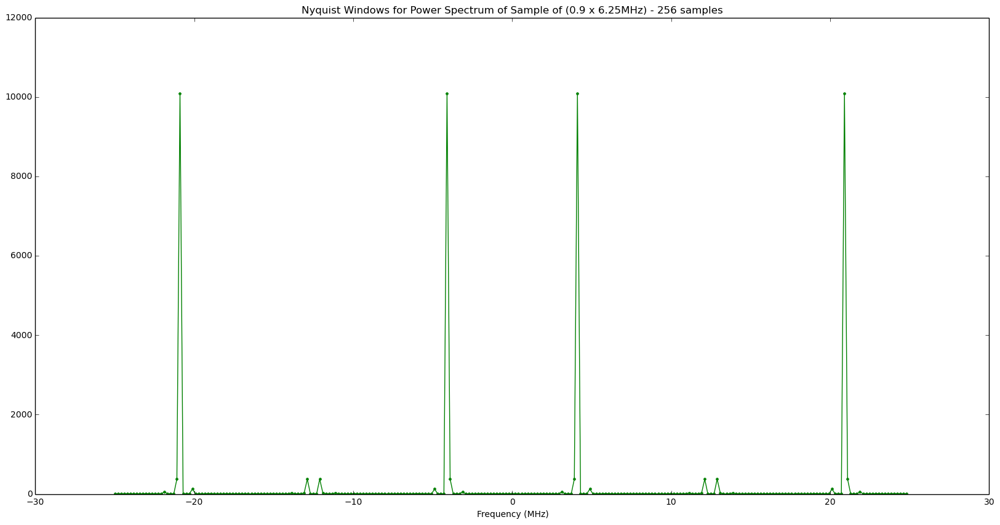

In [58]:
# 3.6 - Nyquist Windows
N = 256
v_samp = 6.25
freq_expanded = np.linspace(8*(-6.25/2),8*(1 - 2/N) * (6.25/2),num=N,endpoint=False)
for i in range(1, 10):
    filename = "sample_" + str(i) + ".npy"
    arr_plot = np.load(filename)
    arr_plot = np.divide(arr_plot, 16384.0)
    pl.figure(i, figsize=(20,10))
    freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N], f=freq_expanded)
    fourier_test = np.abs(fourier_test)**2

noise_sample_1.npy
[ 1280 12032 18432 ...,  9472 -2816 -2560]


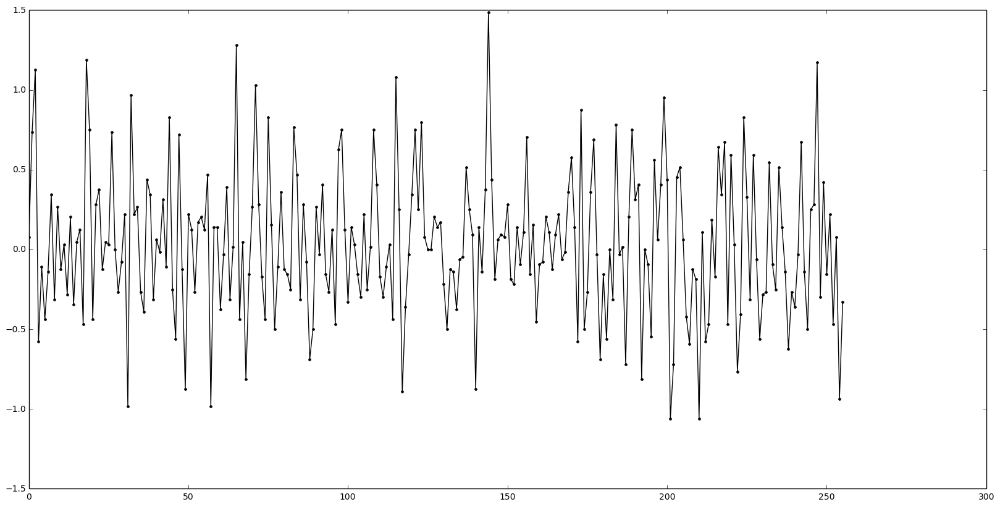

In [118]:
# 3.7 - Fourier Transforms of Noise

i = 32
filename = "noise_sample_" + str(1) + ".npy"
print filename
#arr = ugradio.pico.read_socket("50mV", 10)
print np.load(filename)
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure( figsize=(20,10))
pl.plot(arr_plot[:256], 'k.-')

Mean Voltage is: 0.0256181640625, Mean Square Voltage is: 0.217099594116, RMS Voltage is: 0.465939474735


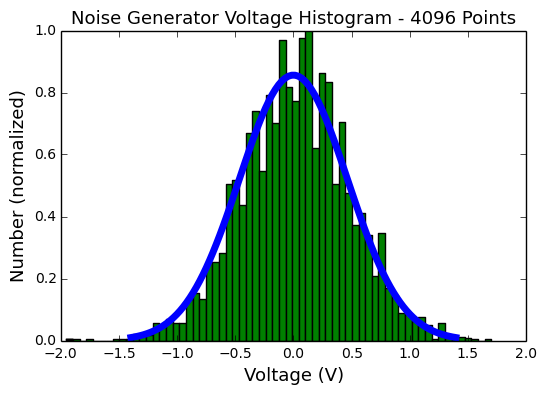

In [115]:
N = 4096

filename = "noise_sample_" + "1" + ".npy"
noise_sample = np.load(filename)
noise_sample = np.divide(noise_sample, 16384.0)

mean = np.mean(noise_sample)
mean_sq = np.mean(np.square(noise_sample))
rms = np.sqrt(mean_sq)
print "Mean Voltage is: " + str(mean) + ", Mean Square Voltage is: " + str(mean_sq) + ", RMS Voltage is: " + str(rms) 

pl.title(r"Noise Generator Voltage Histogram - 4096 Points", fontsize = 13)
pl.ylabel(r"Number (normalized)", fontsize = 13)
pl.xlabel(r"Voltage (V)", fontsize = 13)

pl.gca().set_ylim(0, 1)

pl.figure(1, figsize=(10,5))
#pl.plot(chan, noise_sample[:N], 'k.-')
#pl.figure(i+32, figsize=(20,10))
pl.hist(noise_sample[:N], bins = 64, color = "green", normed=True)

pl.figure(1, figsize=(10,5))
mu = 0
variance = mean_sq
sigma = rms
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
pl.plot(x,mlab.normpdf(x, mu, sigma), linewidth= 5.0)
pl.savefig("graphs/noise_sample_1_hist.pdf")

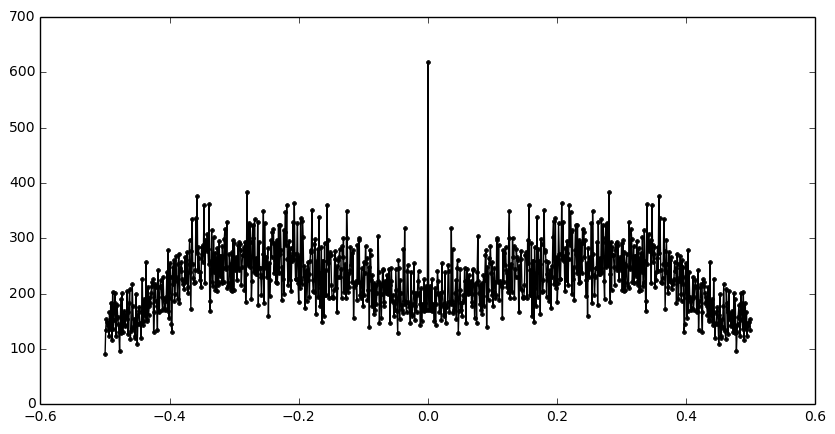

In [127]:
N = 1024
noise_sample_sum = np.zeros(N)
bin_arr = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N/8,endpoint=False)
for i in range(1, 33):
    filename = "noise_sample_" + str(i) + ".npy"
    noise_sample = np.load(filename)
    noise_sample = np.divide(noise_sample, 16384.0)
    freqs, ns_FT = ugradio.dft.dft(noise_sample[N:2*N])
    ns_pwr = np.abs(ns_FT)**2
    noise_sample_sum = np.add(ns_pwr, noise_sample_sum)
noise_sample_avg = np.divide(noise_sample_sum, 32)
pl.figure(figsize=(10,5))
#pl.plot(chan, noise_sample[:N], 'k.-')
#pl.figure(i+32, figsize=(20,10))
pl.plot(freqs, noise_sample_avg, 'k.-')

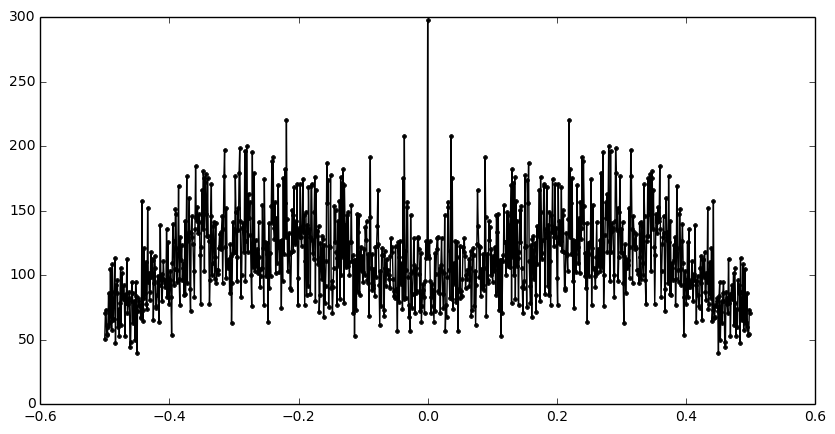

In [138]:
N = 1024
noise_sample_sum = np.zeros(N)
bin_arr = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N/8,endpoint=False)
for i in range(1, 17):
    filename = "noise_sample_" + str(i) + ".npy"
    noise_sample = np.load(filename)
    noise_sample = np.divide(noise_sample, 16384.0)
    freqs, ns_FT = ugradio.dft.dft(noise_sample[N:2*N])
    ns_pwr = np.abs(ns_FT)**2
    noise_sample_sum = np.add(ns_pwr, noise_sample_sum)
noise_sample_avg = np.divide(noise_sample_sum, 32)
pl.figure(figsize=(10,5))
#pl.plot(chan, noise_sample[:N], 'k.-')
#pl.figure(i+32, figsize=(20,10))
pl.plot(freqs, noise_sample_avg, 'k.-')

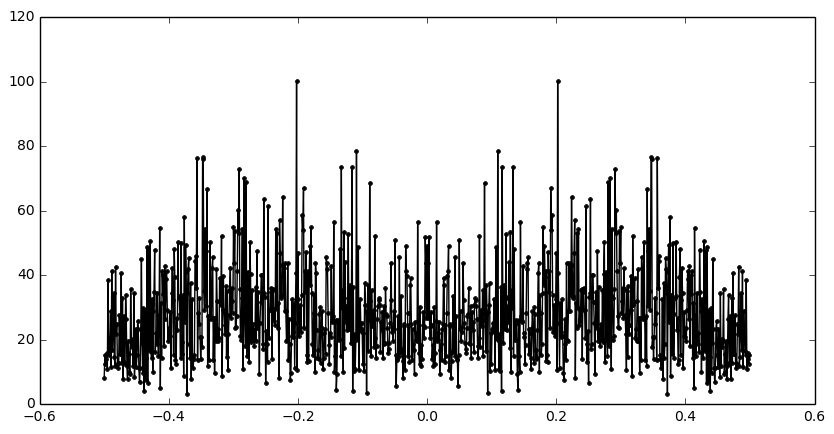

In [130]:
N = 1024
noise_sample_sum = np.zeros(N)
bin_arr = np.linspace((-6.25/2),(1 - 2/N) * (6.25/2),num=N/8,endpoint=False)
for i in range(1, 5):
    filename = "noise_sample_" + str(i) + ".npy"
    noise_sample = np.load(filename)
    noise_sample = np.divide(noise_sample, 16384.0)
    freqs, ns_FT = ugradio.dft.dft(noise_sample[N:2*N])
    ns_pwr = np.abs(ns_FT)**2
    noise_sample_sum = np.add(ns_pwr, noise_sample_sum)
noise_sample_avg = np.divide(noise_sample_sum, 32)
pl.figure(figsize=(10,5))
#pl.plot(chan, noise_sample[:N], 'k.-')
#pl.figure(i+32, figsize=(20,10))
pl.plot(freqs, noise_sample_avg, 'k.-')

64
64


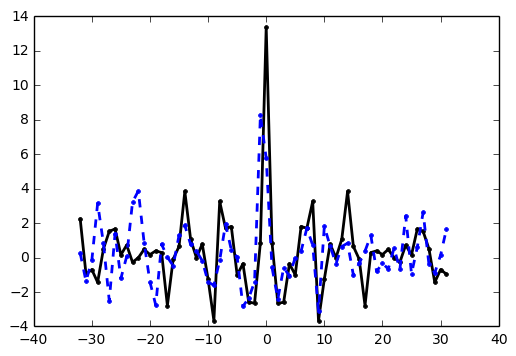

In [136]:
N = 64
filename = "noise_sample_" + str(1) + ".npy"
noise_sample = np.load(filename)
arr_plot = np.divide(noise_sample, 16384.0)

freq_bins, fourier_transform = ugradio.dft.dft(arr_plot[N:2*N])
power_spec = np.abs(fourier_transform)**2
new_bins, inv_fourier = ugradio.dft.idft(power_spec)

pl.plot(new_bins, inv_fourier, 'k.-', linewidth = 2)

ACF = np.correlate(arr_plot[N:2*N], np.concatenate((arr_plot[N/2:3*N/2], arr_plot[(3*N/2 + 1):5*N/2])), "valid")
print len(ACF)
print len(new_bins)
pl.plot(new_bins, ACF, 'b.--', linewidth = 2)

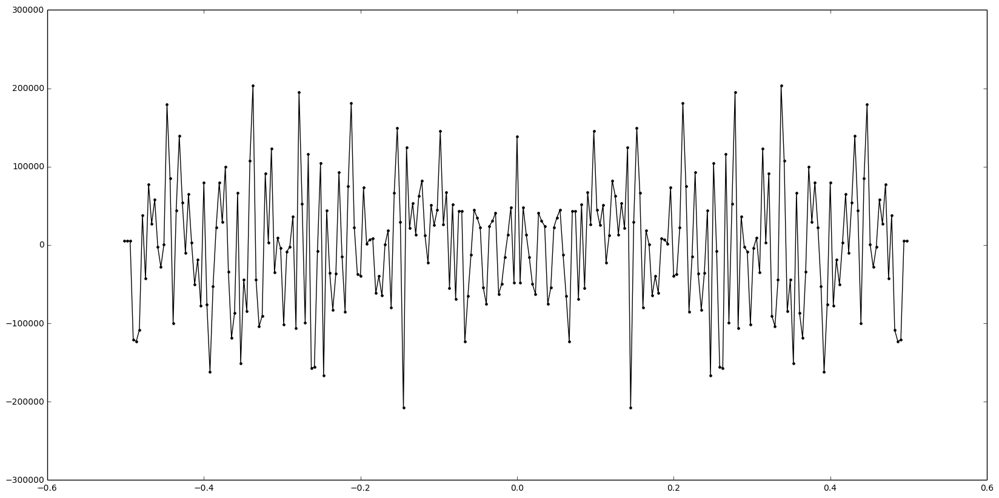

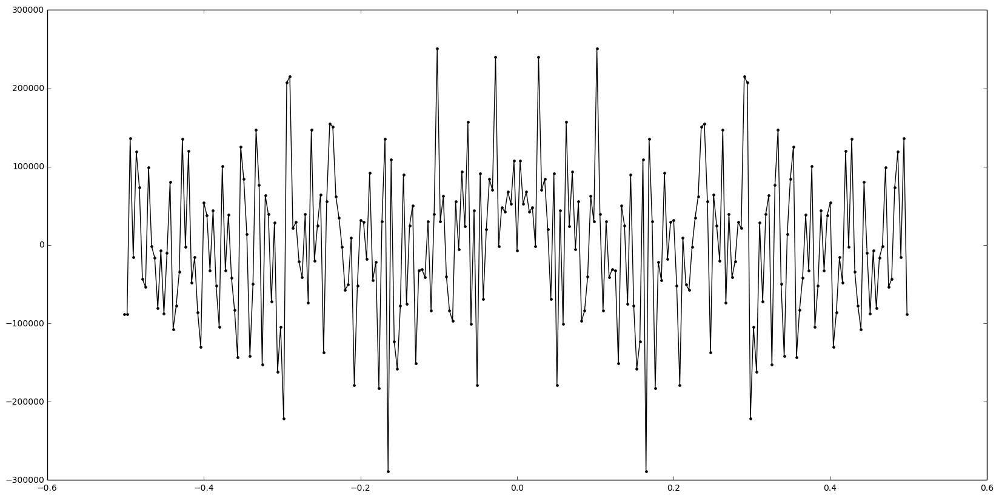

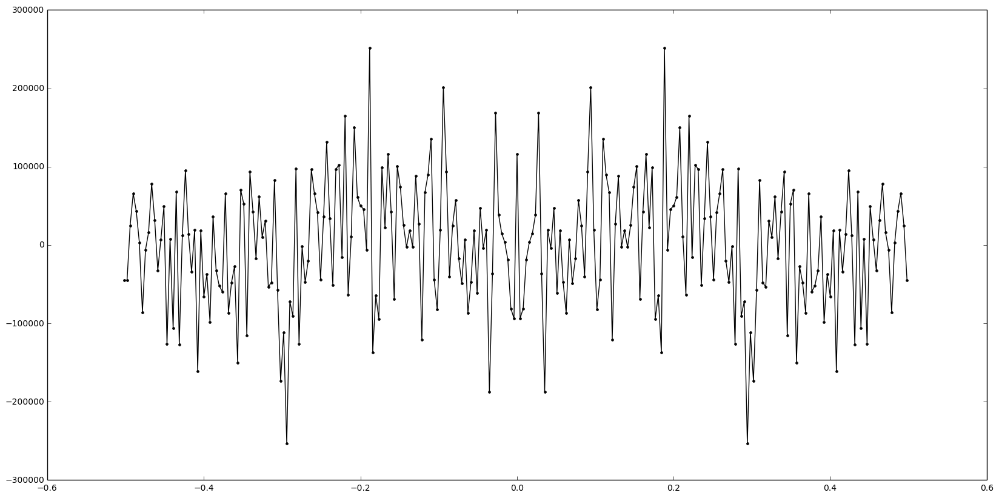

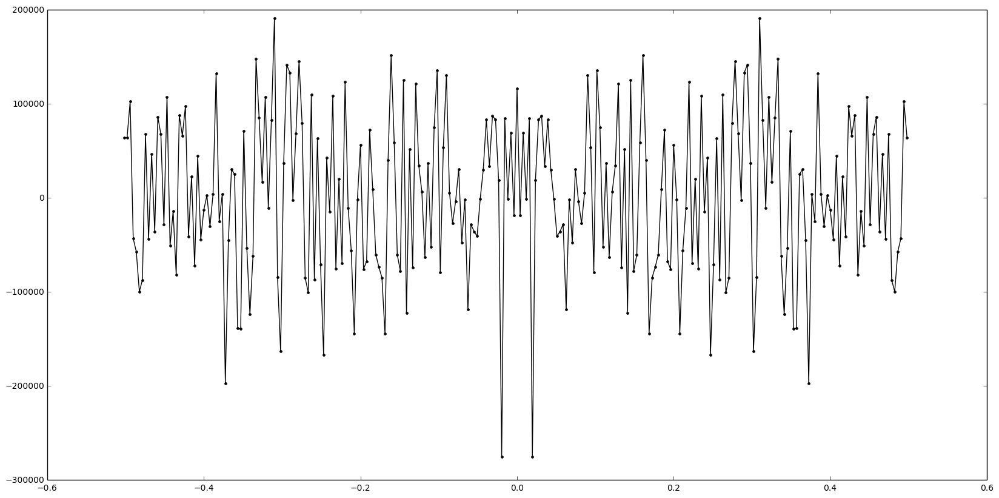

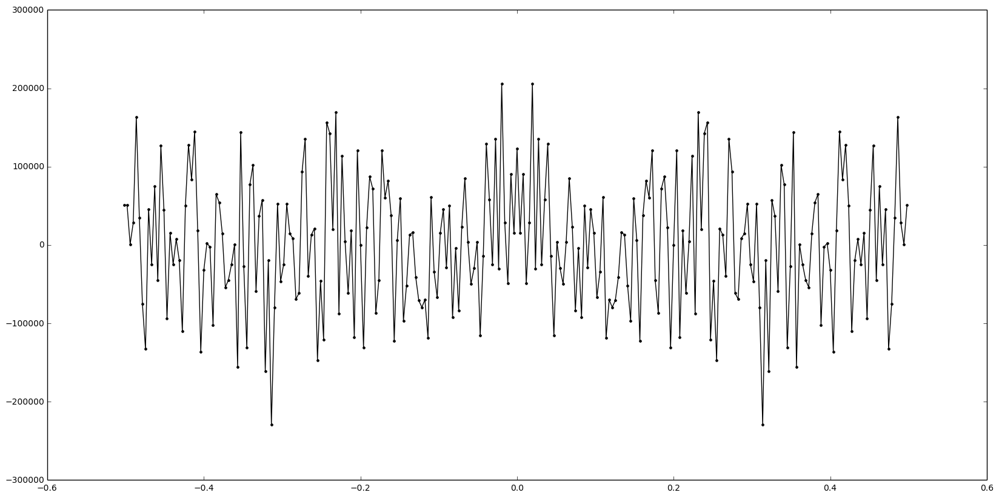

...

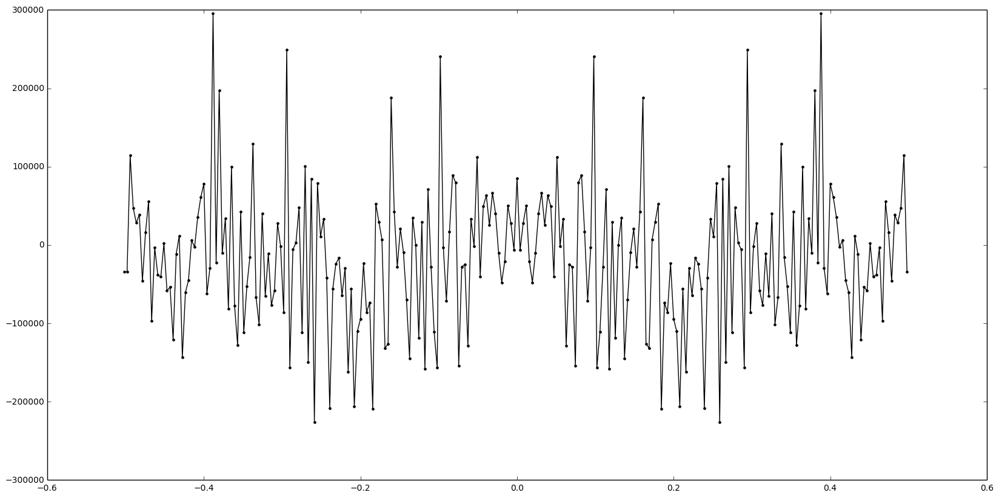

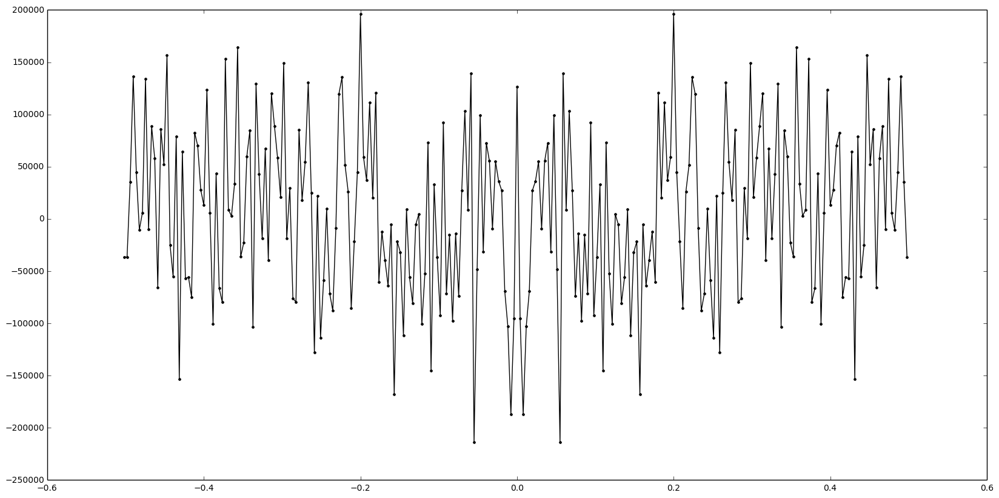

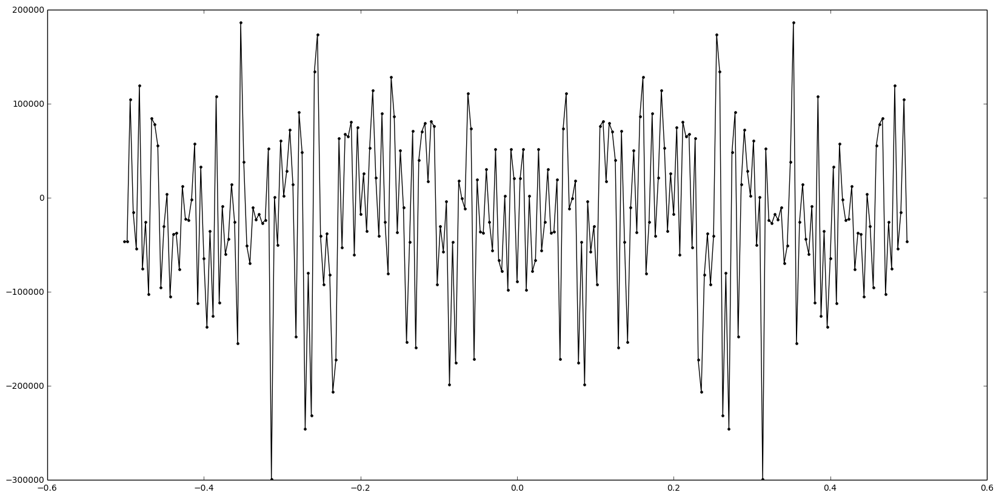

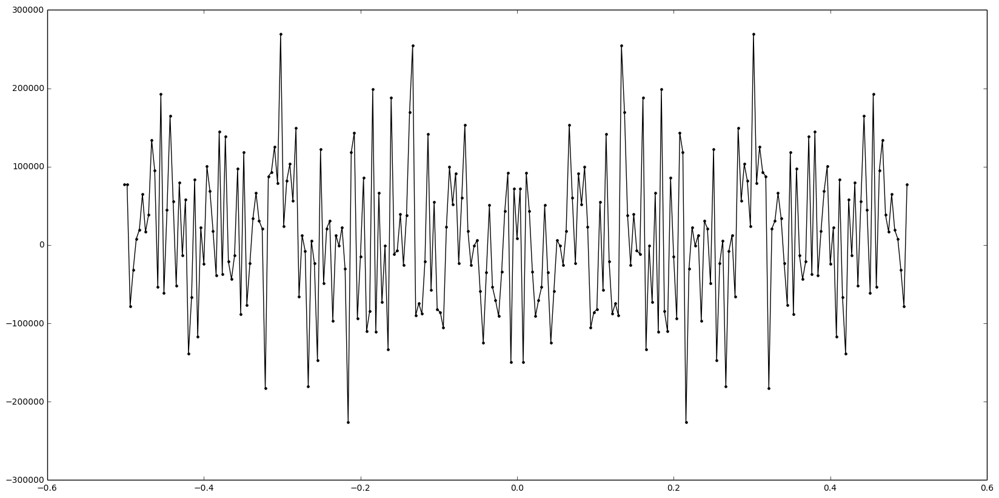

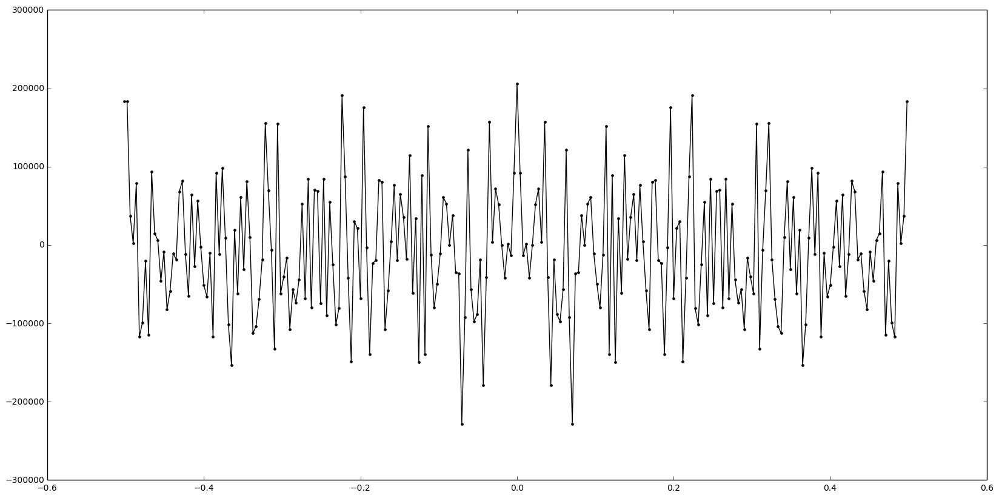

In [7]:
N = 256
for i in range(1, 33):
    filename = "noise_sample_" + str(i) + ".npy"
    noise_sample = np.load(filename)
    freqs, FT_of_noise = ugradio.dft.dft(noise_sample[:N])
    pl.figure(i, figsize=(20,10))
    pl.plot(freqs, FT_of_noise, 'k.-')

Mixer_1500KHz_1425KHz.npy
[-13568   -512 -12032 ...,  -2048 -13568  -1536]
[-13568   -512 -12032 ...,  -2048 -13568  -1536]


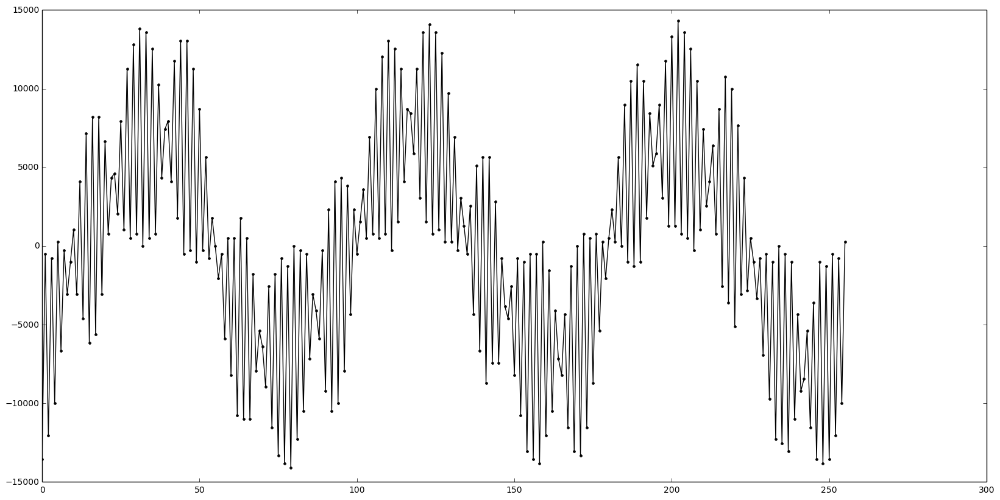

In [16]:
# 5.1 - The Double Sideband Mixer
# using the maximum sampling frequency
filename = "Mixer_1500KHz_1425KHz.npy"
print filename
arr = ugradio.pico.read_socket("200mV", 1)
print arr
np.save(filename, arr)
print np.load(filename)
arr_plot = np.load(filename)
pl.figure(1, figsize=(20,10))
pl.plot(arr_plot[:256], 'k.-')


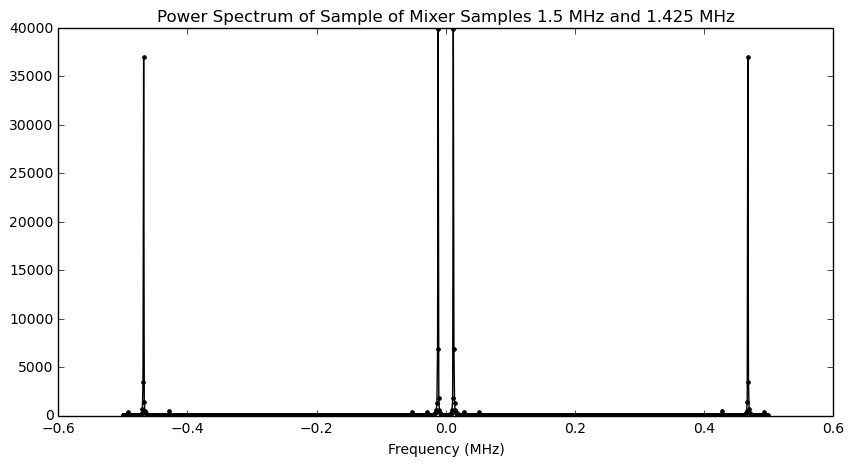

In [116]:
N = 1024
v_samp = 62.5

filename = "Mixer_1500KHz_1425KHz.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(1, figsize=(10,5))
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2
pl.title("Power Spectrum of Sample of Mixer Samples 1.5 MHz and 1.425 MHz")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, fourier_test, 'k.-')



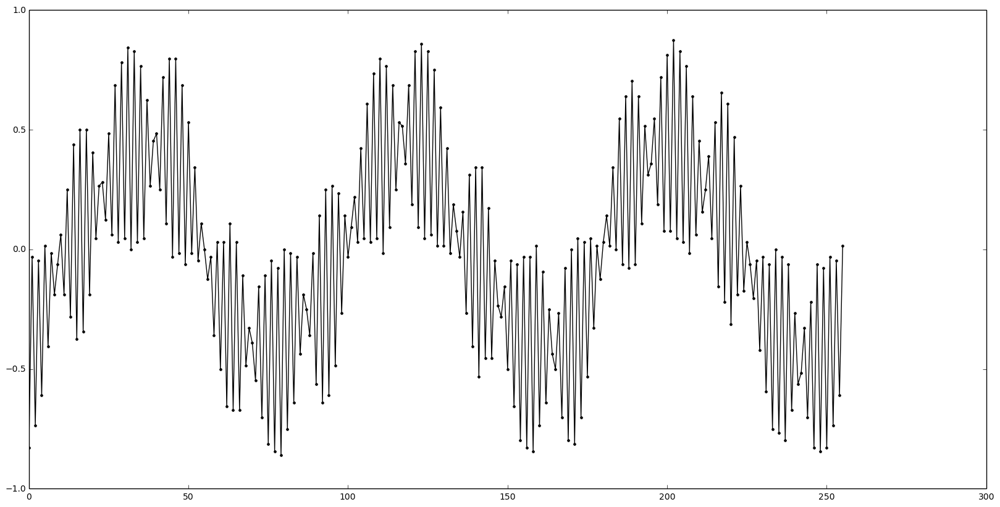

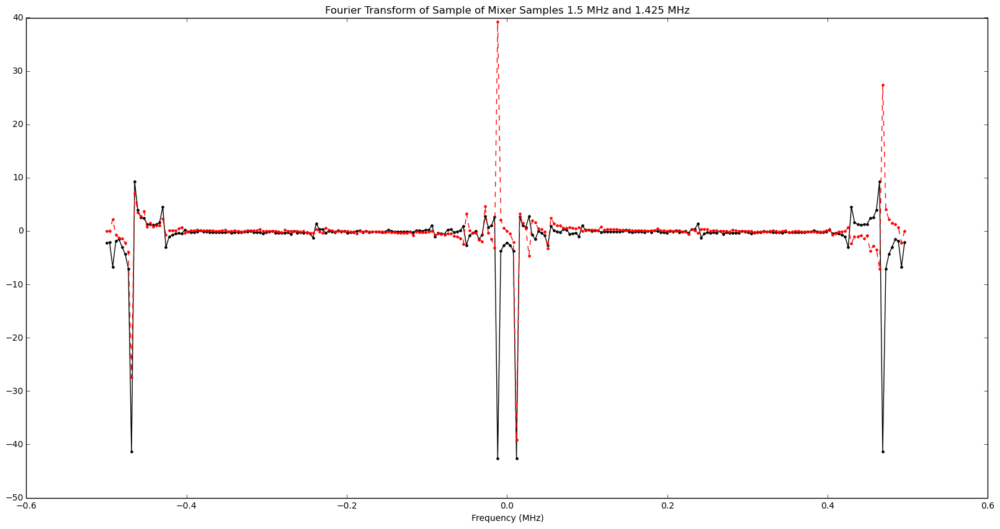

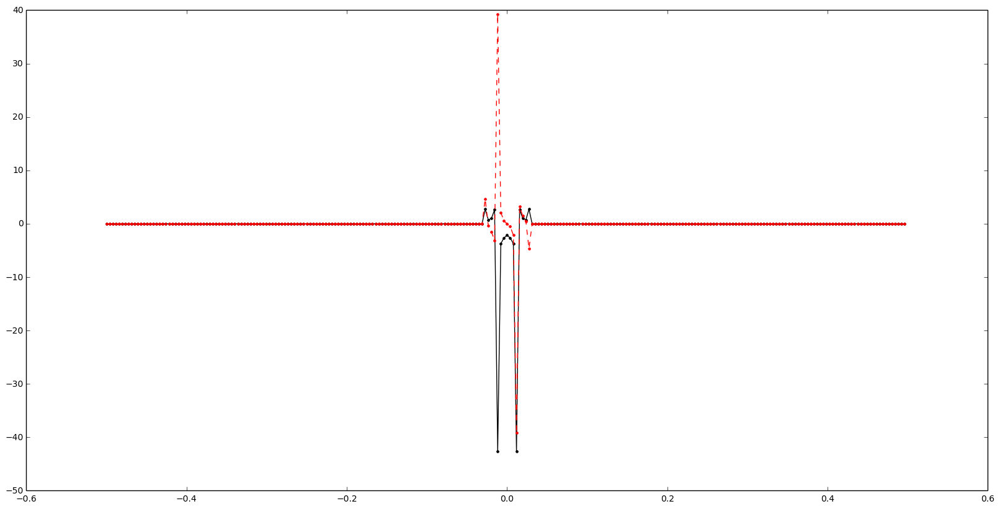

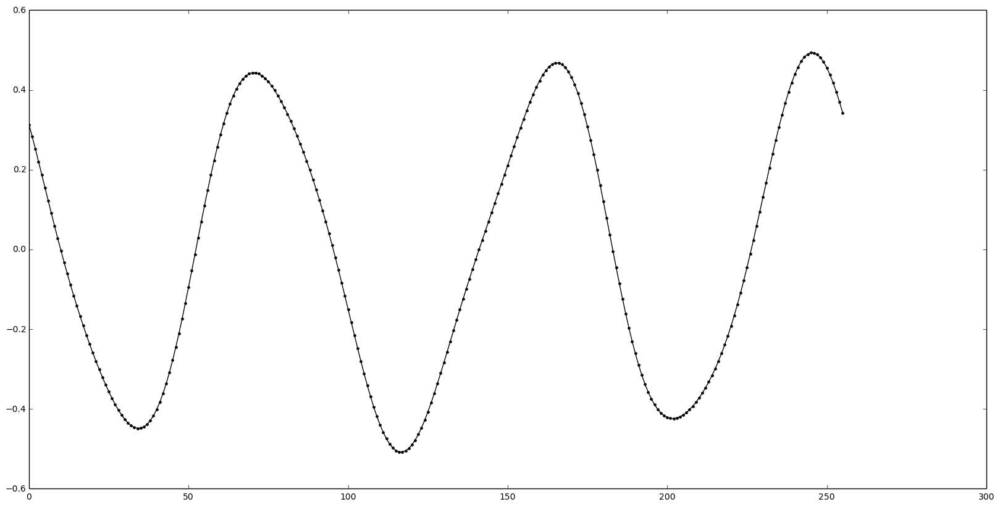

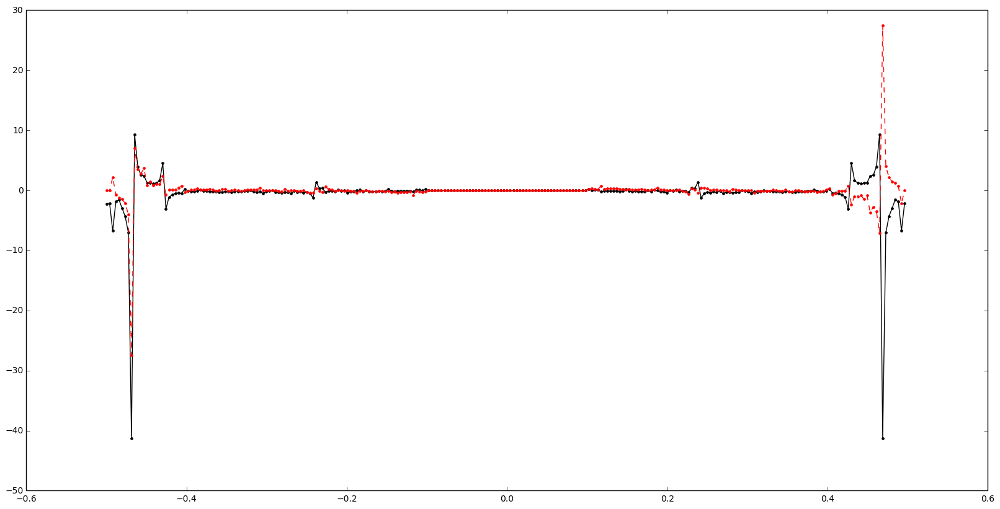

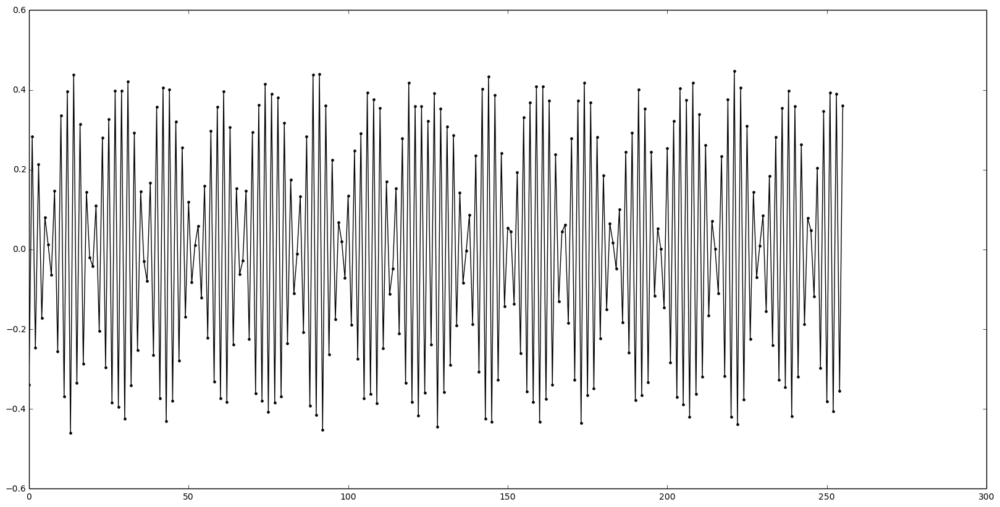

In [10]:
N = 256
filename = "Mixer_1500KHz_1425KHz.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(1, figsize=(20,10))
pl.plot(arr_plot[:N], 'k.-')

pl.figure(2, figsize=(20,10))
freq_new, fourier = ugradio.dft.dft(arr_plot[:N])
pl.title("Fourier Transform of Sample of Mixer Samples 1.5 MHz and 1.425 MHz")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

for i in range(len(fourier)):
    if i < 0.47*len(fourier) or i > 0.53*len(fourier):
        fourier[i] = 0.0
pl.figure(3, figsize=(20,10))
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

time_new, inv_fourier = ugradio.dft.idft(fourier)
pl.figure(4, figsize=(20,10))
pl.plot( inv_fourier, 'k.-')


freq_new, fourier = ugradio.dft.dft(arr_plot[:N])

for i in range(len(fourier)):
    if i > 0.4*len(fourier) and i < 0.6*len(fourier):
        fourier[i] = 0.0
pl.figure(5, figsize=(20,10))
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

time_new, inv_fourier = ugradio.dft.idft(fourier)
pl.figure(6, figsize=(20,10))
pl.plot( inv_fourier, 'k.-')

/usr/local/lib/python2.7/dist-packages/numpy/core/numeric.py:531: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


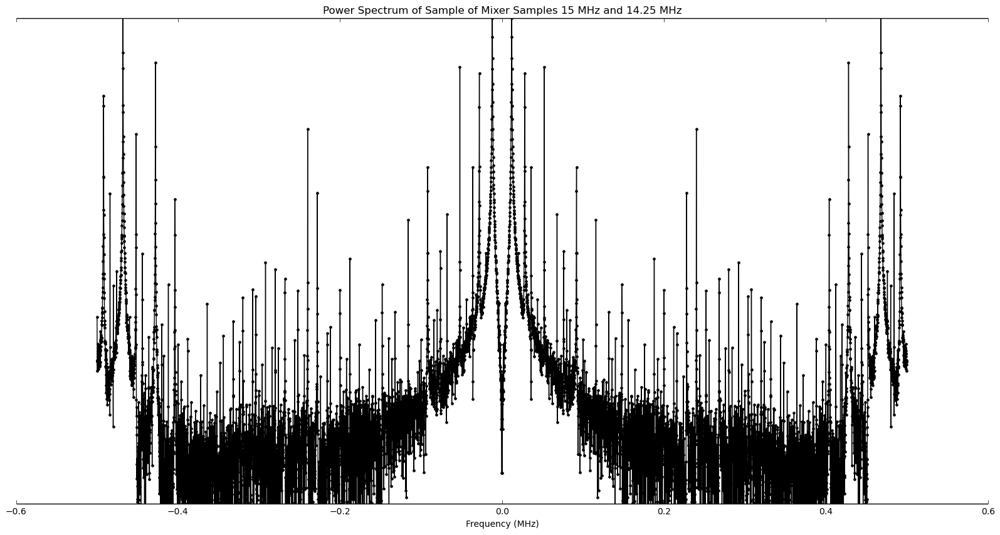

In [2]:
# 5.2 - Real Mixers: Intermodulation Products

N = 8192
filename = "Mixer_1500KHz_1425KHz.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(1, figsize=(20,10))
pl.gca().set_ylim(0, 16*N)
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2
pl.title("Power Spectrum of Sample of Mixer Samples 15 MHz and 14.25 MHz")
pl.xlabel("Frequency (MHz)")
pl.semilogy(freq_new, fourier_test, 'k.-')

SSB_2100KHz_1500KHz_2.npy
[ -256 11008  1280 ...,  -512 -3840  7424]
[ -256 11008  1280 ...,  -512 -3840  7424]


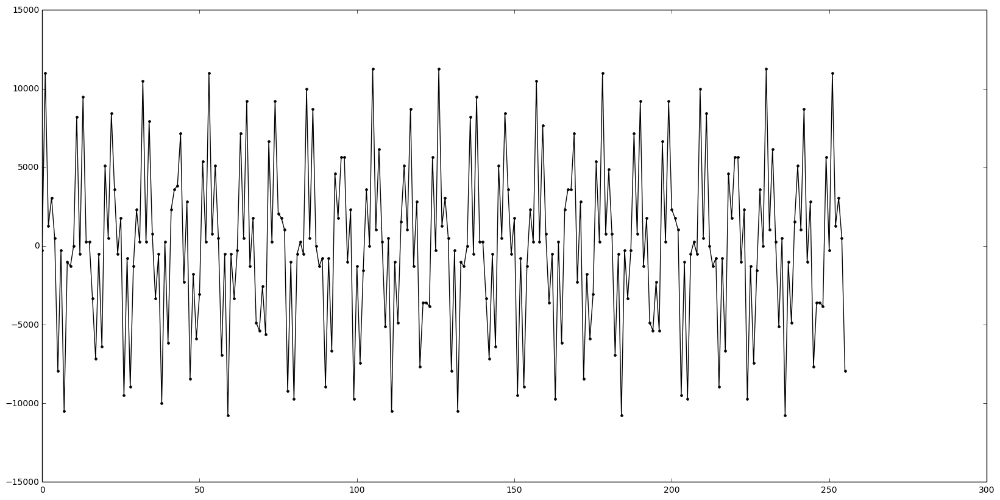

In [21]:
# 5.3
filename = "SSB_2100KHz_1500KHz_2.npy"
print filename
arr = ugradio.pico.read_socket("200mV", 1)
print arr
np.save(filename, arr)
print np.load(filename)
arr_plot = np.load(filename)
pl.figure(i, figsize=(20,10))
pl.plot(arr_plot[:256], 'k.-')

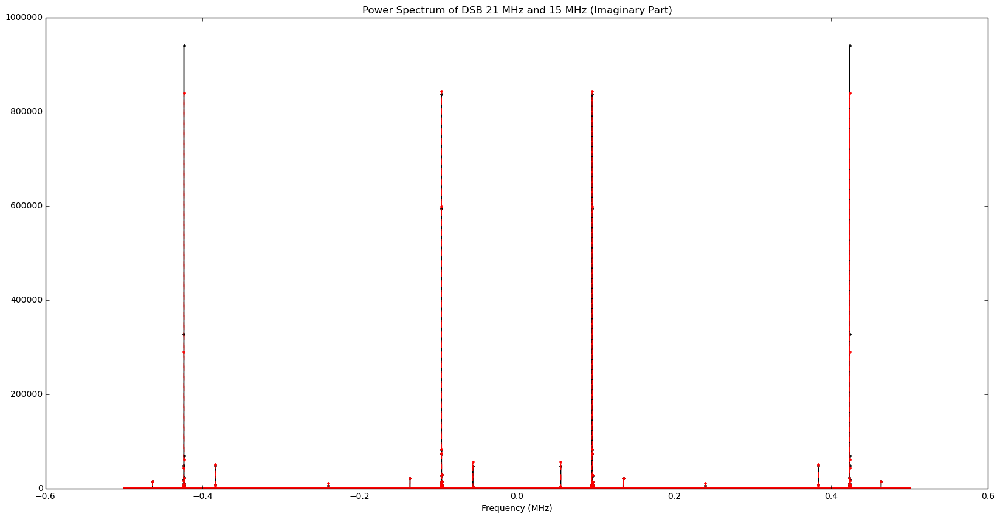

In [4]:
N = 8192
filename = "DSB_2100KHz_1500KHz_1.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(1, figsize=(20,10))
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2
pl.title("Power Spectrum of DSB 21 MHz and 15 MHz (Real Part)")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, fourier_test, 'k.-')


filename = "DSB_2100KHz_1500KHz_2.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(2, figsize=(20,10))
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2
pl.title("Power Spectrum of DSB 21 MHz and 15 MHz (Imaginary Part)")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, fourier_test, 'r.--')

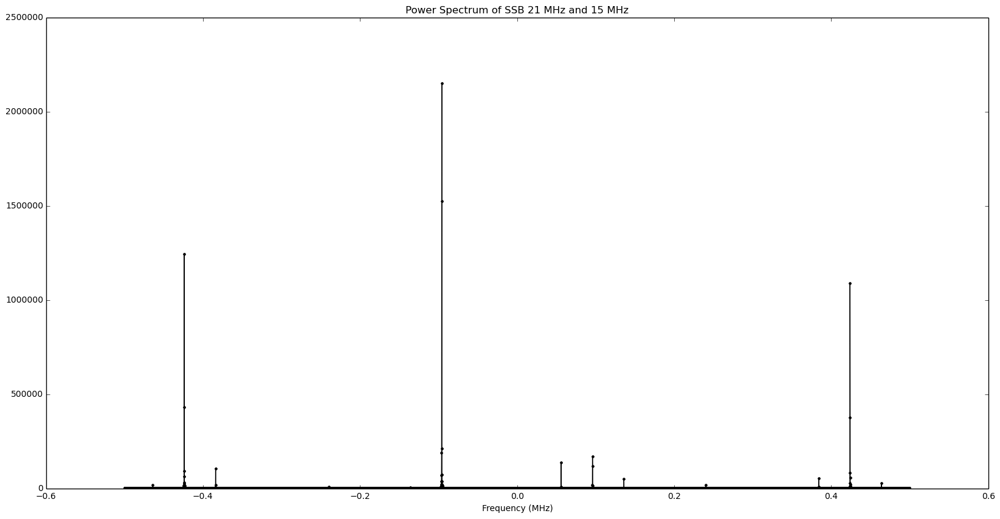

In [14]:
N = 8192
filename1 = "SSB_2100KHz_1500KHz_1.npy"
filename2 = "SSB_2100KHz_1500KHz_2.npy"
arr_plot1 = np.load(filename1)
arr_plot2 = np.load(filename2)
arr_plot1 = np.divide(arr_plot1, 16384.0)
arr_plot2 = np.divide(arr_plot2, 16384.0)

arr_plot2 = np.multiply(arr_plot2, 1j)

arr_plot = arr_plot1 + arr_plot2

pl.figure(figsize=(20,10))
freq_new, fourier_test = ugradio.dft.dft(arr_plot[:N])
fourier_test = np.abs(fourier_test)**2
pl.title("Power Spectrum of SSB 21 MHz and 15 MHz ")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, fourier_test, 'k.-')


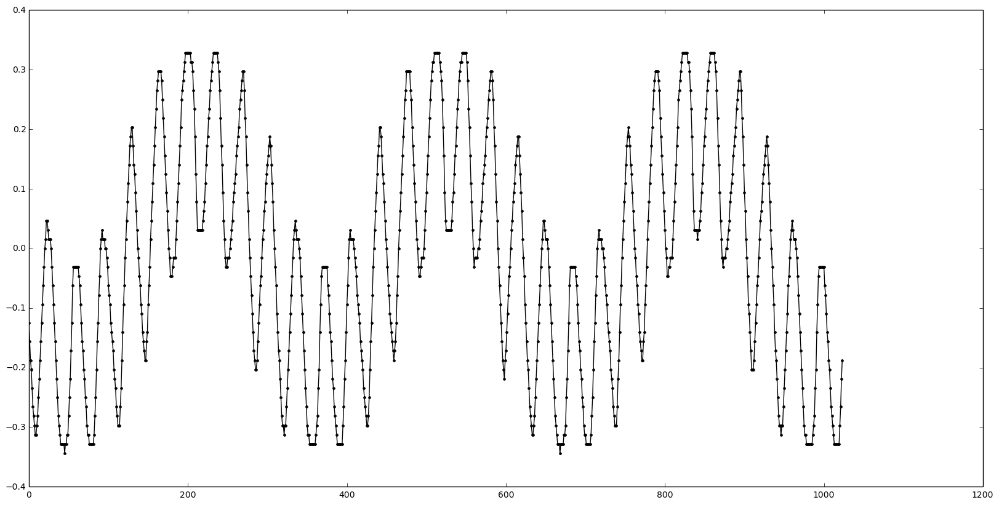

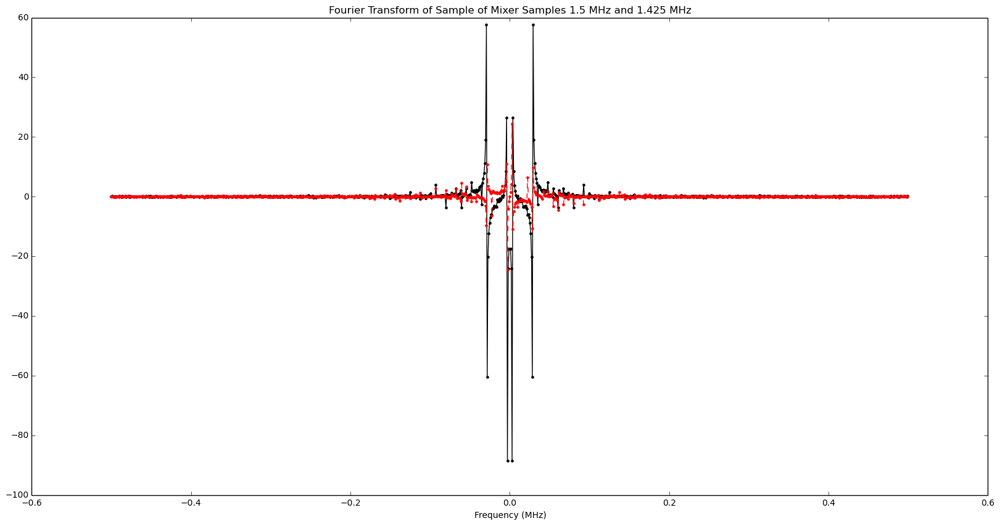

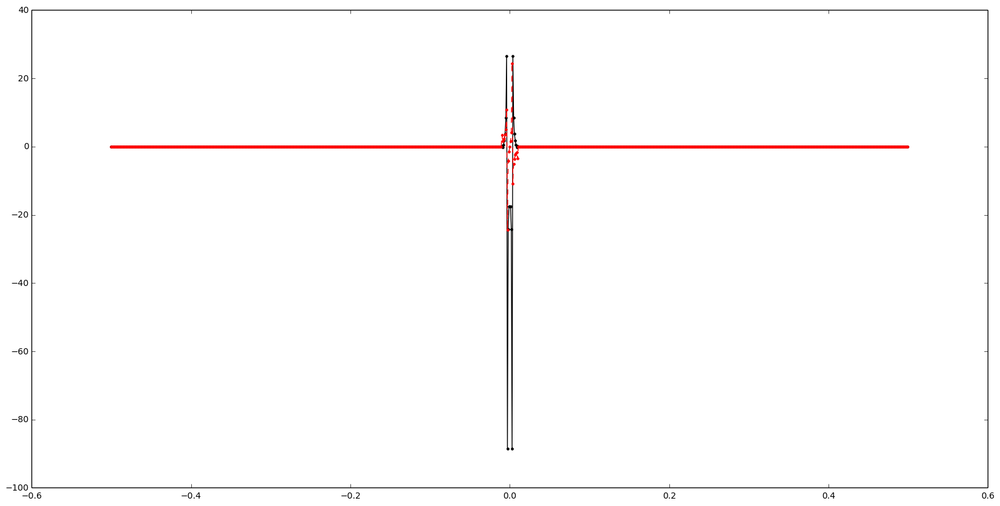

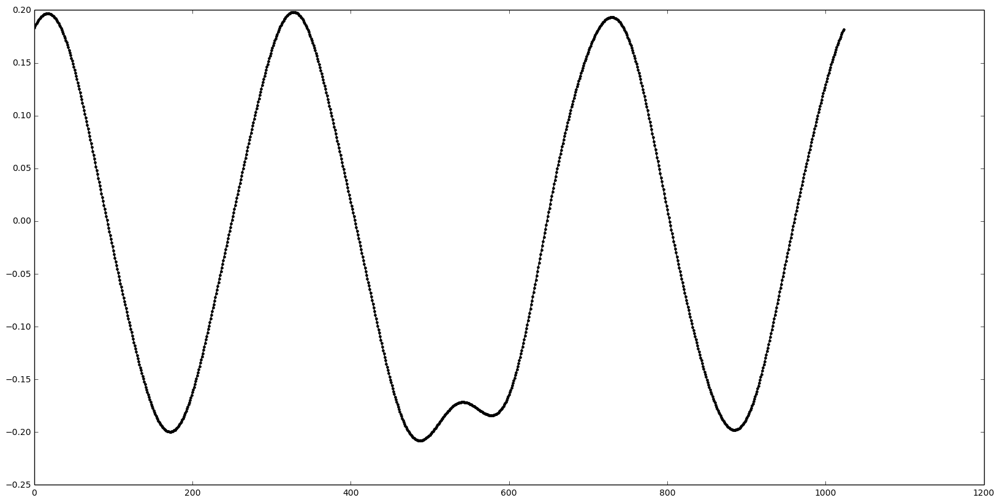

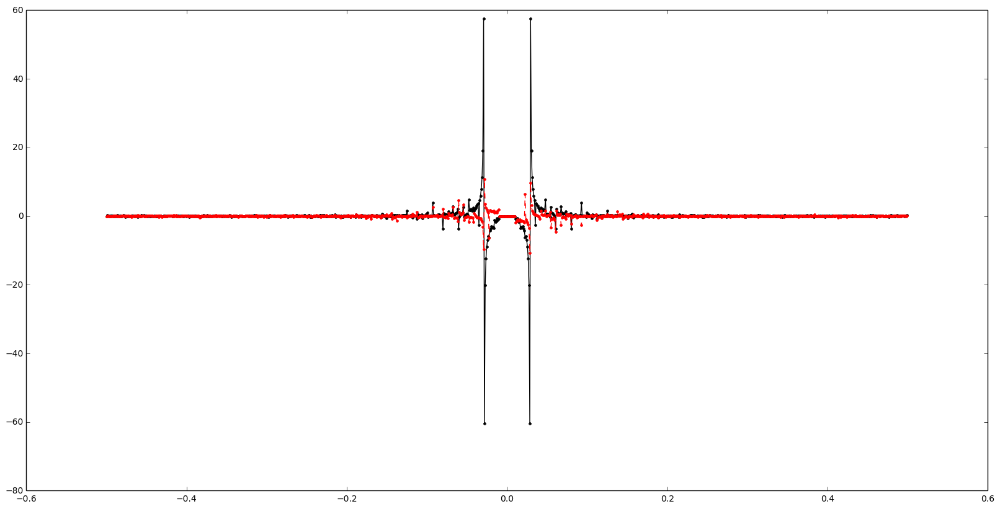

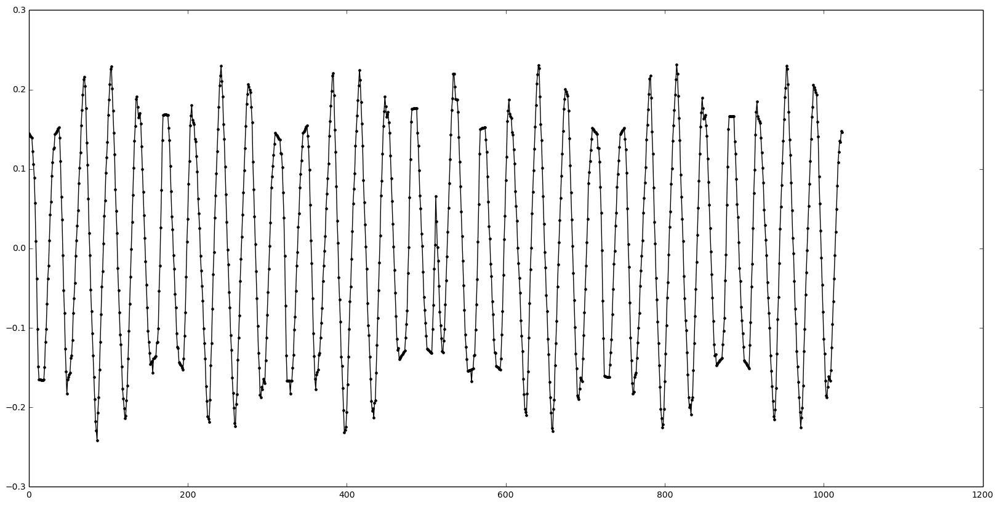

In [24]:
N = 1024
filename = "mixer_80-100.npy"
arr_plot = np.load(filename)
arr_plot = np.divide(arr_plot, 16384.0)
pl.figure(1, figsize=(20,10))
pl.plot(arr_plot[:N], 'k.-')

pl.figure(2, figsize=(20,10))
freq_new, fourier = ugradio.dft.dft(arr_plot[:N])
pl.title("Fourier Transform of Sample of Mixer Samples 1.5 MHz and 1.425 MHz")
pl.xlabel("Frequency (MHz)")
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

for i in range(len(fourier)):
    if i < 0.49*len(fourier) or i > 0.51*len(fourier):
        fourier[i] = 0.0
pl.figure(3, figsize=(20,10))
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

time_new, inv_fourier = ugradio.dft.idft(fourier)
pl.figure(4, figsize=(20,10))
pl.plot( inv_fourier, 'k.-')


freq_new, fourier = ugradio.dft.dft(arr_plot[:N])

for i in range(len(fourier)):
    if i > 0.49*len(fourier) and i < 0.51*len(fourier):
        fourier[i] = 0.0
pl.figure(5, figsize=(20,10))
pl.plot(freq_new, np.real(fourier), 'k.-')
pl.plot(freq_new, np.imag(fourier), 'r.--')

time_new, inv_fourier = ugradio.dft.idft(fourier)
pl.figure(6, figsize=(20,10))
pl.plot( inv_fourier, 'k.-')